In [11]:
#import packages
import numpy as np
import matplotlib.pyplot as plt
import os
import matplotlib as mpl
from matplotlib import rcParams
from matplotlib.colors import Normalize
import matplotlib.cm as cm
from matplotlib.colors import LogNorm
from matplotlib import ticker
from matplotlib import colors
from IPython.display import set_matplotlib_formats
from mpl_toolkits.axes_grid1 import make_axes_locatable
import manipulate_text as mt
import constants_and_functions as cf
import numpy.ma as ma
import matplotlib.style as style
style.use('seaborn-colorblind')

#defualt settings
savefig_dpi = 120
fig_width = 6
fig_height = 6
labelsize = 22
titlesize = 22
fontsize = 18
linewidth = 2.0
markersize = 4
leg_fontsize = 16

#rc settings
rcParams.update({'figure.autolayout': True})
plt.rc('font', family='serif')
set_matplotlib_formats('pdf', 'png')
plt.rcParams['savefig.dpi'] = savefig_dpi
plt.rcParams['figure.autolayout'] = False
plt.rcParams['figure.figsize'] = fig_width, fig_height
plt.rcParams['axes.labelsize'] = labelsize
plt.rcParams['axes.titlesize'] = titlesize
plt.rcParams['font.size'] = fontsize
plt.rcParams['lines.linewidth'] = linewidth
plt.rcParams['lines.markersize'] = markersize
plt.rcParams['legend.fontsize'] = leg_fontsize
mpl.rc('axes',edgecolor='k')
plt.rcParams['xtick.color'] = 'k'
plt.rcParams['ytick.color'] = 'k'
plt.rcParams['text.usetex'] = True
plt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]
plt.rcParams['image.cmap'] = 'cividis'

/cms/base/HETconda/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
/cms/base/HETconda/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: MatplotlibDeprecationWarning: Support for setting the 'text.latex.preamble' or 'pgf.preamble' rcParam to a list of strings is deprecated since 3.3 and will be removed two minor releases later; set it to a single string instead.


In [12]:
#relevant paths
base_path = os.getcwd().split('scripts')[0]
array_path = base_path + 'fig_arrays/'
fig_path = base_path+'final_figsv1/'

In [13]:
def latex_float(f, n):
    kwrd = '{0:.' +str(n)+ 'e}'
    float_str = kwrd.format(f)
    if "e" in float_str:
        base, exponent = float_str.split("e")
        return r"{0} \times 10^{{{1}}}".format(base, int(exponent))
    else:
        return float_str
    
def load_arrays(path, label, names, suffix='.npy'):
    arrays = [np.load(path+label+'__'+name+suffix) for name in names]
    return arrays

def round_sigfigs(x, n):
    digits = int(np.floor(np.log10(x)) + 1)
    y = x/10**digits
    y = np.round(y, n)
    x = y*10**digits
    res = format(x, '.' + str(max(n-digits, 0)) + 'f')
    return res

def make_image_M31(data, xcoords, ycoords, minmax=None, title=None, fig_size=(2*fig_width, 2*fig_width)):
    fig = plt.figure(figsize=fig_size)
    ax = fig.add_subplot(111)
    if minmax is None:
        im = ax.imshow(data, extent = [xcoords[0], xcoords[-1], ycoords[0], ycoords[-1]], aspect='equal')
    else:
        im = ax.imshow(data, extent = [xcoords[0], xcoords[-1], ycoords[0], ycoords[-1]], vmin=minmax[0], vmax=minmax[1], aspect='equal')
    ax.set_xlabel(r'$x \; \rm{(kpc)}$')
    ax.set_ylabel(r'$y \; \rm{(kpc)}$') 
    
    if title is None:
        loc = 'top'
        gap = 0.05
    else:
        loc = 'bottom'
        gap = 0.8
        ax.set_title(title)
        
    divider = make_axes_locatable(ax)
    cax = divider.append_axes(loc, size='10%', pad=gap)
    cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
    cbar.set_label(r'$\frac{dS}{d\nu}\; \rm{(mJy/beam)}$')
    cbar.ax.xaxis.set_ticks_position(loc)
    cbar.ax.xaxis.set_label_position(loc)
    return fig, ax

def f0(x, w):
    return w*np.ones(x[0].shape)

def f1(x, w):
    elliptic_d = np.sqrt(x[0]**2+w[1]**2*x[1]**2)
    return w[0]*np.exp(-(elliptic_d-w[2])**2/(2*w[3]**2))

def background(x, w):
    return f0(x, w[0]) + f1(x, w[1:])

In [275]:
round_sigfigs(3, 3)

'3.00'

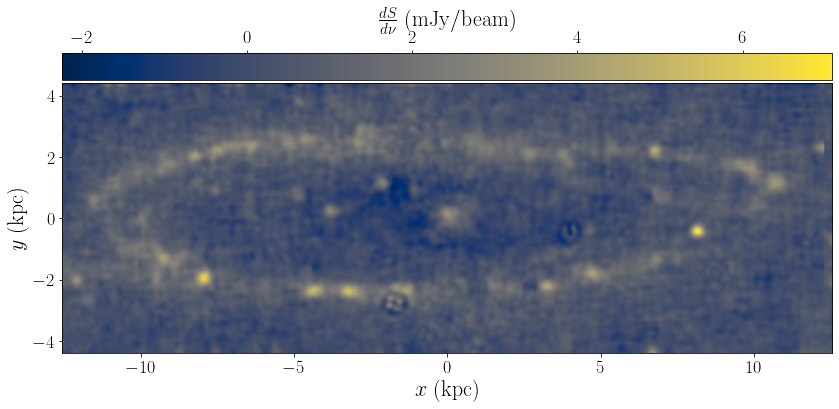

In [14]:
'''
Figure 1

This figure shows the radio data that we use to constrain dark matter
The data comes from Fig. 9 of https://arxiv.org/abs/1910.09634

The arrays for the figure come from the file Stats_method4.ipynb
'''

tex_label = 'intensity_map'
data = np.load(array_path + tex_label + '__data.npy')
mindata = np.min(data)
maxdata = np.max(data)
DA=785
#load and rescale coords using the distance to M31
xcoords = DA*np.load(array_path + tex_label + '__xcoords.npy')
ycoords = DA*np.load(array_path + tex_label + '__ycoords.npy')


#setting fig size based on 2 times the width of a collumn. Since aspect is equal and fig is long, 
#the size will be set by the width if I make the height the same as the width
fig, _ = make_image_M31(data, xcoords, ycoords, minmax=[mindata, maxdata])
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

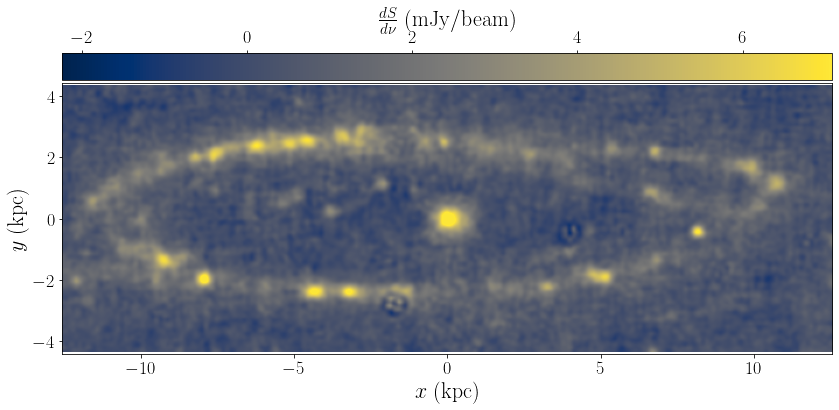

In [15]:
'''
Figure 1 v2

This figure shows the radio data that we use to constrain dark matter
The data comes from Fig. 9 of https://arxiv.org/abs/1910.09634

The arrays for the figure come from the file Stats_method4.ipynb
'''

tex_label = 'intensity_map_tot'
data = np.load(array_path + tex_label + '__data.npy')
#mindata = np.min(data)
#maxdata = np.max(data)
#load and rescale coords using the distance to M31
xcoords = DA*np.load(array_path + tex_label + '__xcoords.npy')
ycoords = DA*np.load(array_path + tex_label + '__ycoords.npy')


#setting fig size based on 2 times the width of a collumn. Since aspect is equal and fig is long, 
#the size will be set by the width if I make the height the same as the width
fig, _ = make_image_M31(data, xcoords, ycoords, minmax=[mindata, maxdata])
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

In [138]:
data[int(data.shape[0]/2, data.shape[1]/2]

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

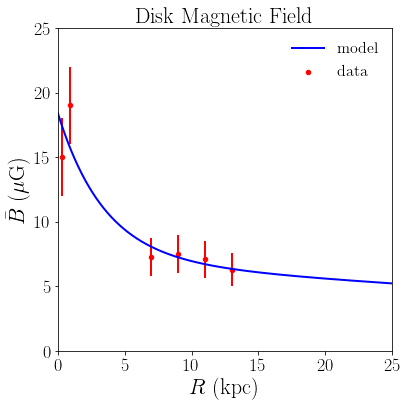

In [16]:
'''
Figure 2

This figure shows the magnetic field model and the data we use to construct it
The arrays come from the file magnetic_field_fit.ipynb
'''

tex_label = 'magnetic_field_disk'

#set max and min values of the x axis
Rmin = 0
Rmax = 25

#load arrays
B0, R0, B1, R1 = np.load(array_path + tex_label+ '__Bparams.npy') #model parameters
Rmeas = np.load(array_path + tex_label+ '__R.npy') #measured R
Bmeas = np.load(array_path + tex_label+ '__Bmeas.npy') #measured B
Berr = np.load(array_path + tex_label+ '__Berr.npy') #errors of B

#construct model
R_model = np.linspace(Rmin, Rmax, 1000)
B_model = B0*np.exp(-R_model/R0) + B1*np.exp(-R_model/R1) 

fig = plt.figure()
ax = fig.add_subplot(111)
ax.errorbar(Rmeas[:-1], Bmeas[:-1], yerr=Berr[:-1], fmt='none', color='r')
ax.scatter(Rmeas[:-1], Bmeas[:-1], s=20, color='r', label='data')
ax.plot(R_model, B_model, color='b', label='model')
ax.legend(frameon=False)
ax.set_xlabel(r'$R \; \rm(kpc)$')
ax.set_ylabel(r'$\bar{B} \; \rm(\mu G)$')
ax.set_title(r'Disk Magnetic Field')
ax.set_ylim([0, 25])
ax.set_xlim([Rmin, Rmax])
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

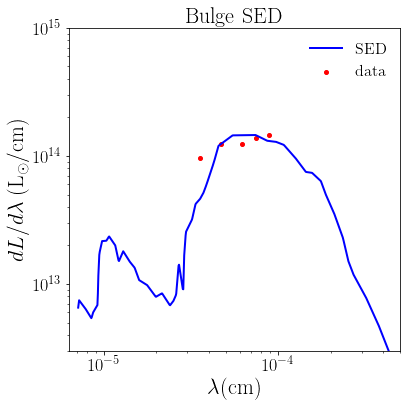

In [17]:
'''
Figure 3a

This figure shows the SED of the bulge
The arrays come from the file modeling_andromeda.ipynb
'''

tex_label = 'bulge_SED'

#load arrays
names = ['model_L', 'model_lamda_cm', 'data_L', 'data_lamda_cm']
L_bul, lam_bul, L_ugriz_bul, lam_ugriz = load_arrays(array_path, tex_label, names)


#make figure
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(lam_bul, L_bul, color='b', label=r'SED')
ax.scatter(lam_ugriz, L_ugriz_bul, color='r', label=r'data')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title(r'Bulge SED')
ax.set_xlabel(r'$\lambda \rm (cm)$')
ax.set_ylabel(r'$dL/d\lambda \; \rm (L_\odot/cm)$')
#set SED lims here for fig:bulge_SED and fig:disk_SED
SED_xlims = [10**(-5.2), 5e-4]
SED_ylims = [3e12, 1e15]
ax.set_xlim(SED_xlims)
ax.set_ylim(SED_ylims)
ax.legend(frameon=False, loc='upper right')
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

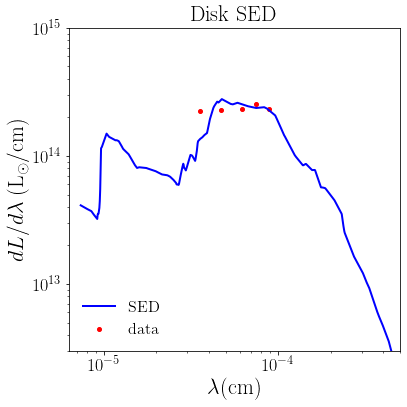

In [18]:
'''
Figure 3b

This figure shows the SED of the disk
The arrays come from the file modeling_andromeda.ipynb
'''

tex_label = 'disk_SED'

#load arrays
names = ['model_L', 'model_lamda_cm', 'data_L', 'data_lamda_cm']
L_dis, lam_dis, L_ugriz_dis, lam_ugriz = load_arrays(array_path, tex_label, names)


#make figure
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(lam_dis, L_dis, color='b', label=r'SED')
ax.scatter(lam_ugriz, L_ugriz_dis, color='r', label=r'data')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title(r'Disk SED')
ax.set_xlabel(r'$\lambda \rm (cm)$')
ax.set_ylabel(r'$dL/d\lambda \; \rm (L_\odot/cm)$')
ax.set_xlim(SED_xlims)
ax.set_ylim(SED_ylims)
ax.legend(frameon=False, loc='lower left')
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

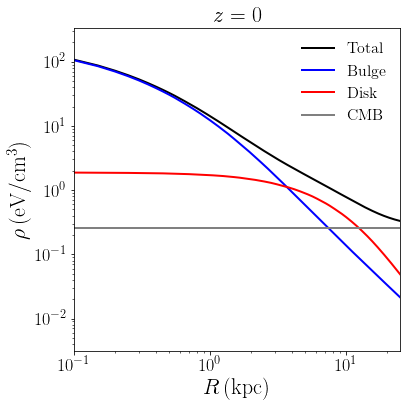

In [749]:
'''
Figure 4

Distribution of ISRF on the disk
The arrays come from the file modeling_andromeda.ipynb
'''

tex_label = 'ISRF'

names = ['R', 'rho_tot', 'rho_bulge', 'rho_disk']
R_grid, rho_tot, rho_bul, rho_dis = load_arrays(array_path, tex_label, names)
rho_CMB = cf.rho_CMB*np.ones(len(R_grid))
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(R_grid, rho_tot+rho_CMB, label='Total', color='k')
ax.plot(R_grid, rho_bul, label= 'Bulge', color='b')
ax.plot(R_grid, rho_dis, label='Disk', color='r')
ax.plot(R_grid, rho_CMB, label='CMB', color='.5')
ax.legend(frameon= False)
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel(r'$R \, \rm{(kpc)}$')
ax.set_ylabel(r'$\rho \, \rm{(eV/cm^3)}$')
ax.set_xlim([Rmin+.1, Rmax])
ax.set_title(r'$z = 0$')
fig.tight_layout()
#fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

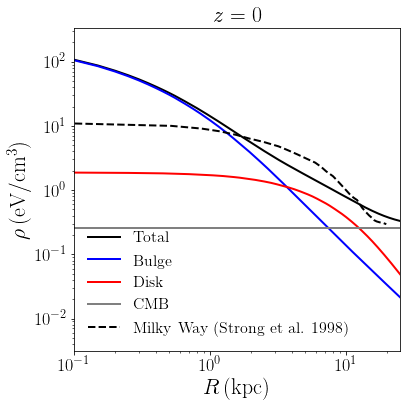

In [123]:
'''
Figure 4 v2

Distribution of ISRF on the disk for M31 and MW
The arrays come from the file modeling_andromeda.ipynb
MW ISRF comes from digitizing astro-ph/9811296
'''

tex_label = 'ISRF'
R_MW = np.array([0.03466204506065858, 0.5199306759098786, 0.8665511265164645, 1.1785095320623917, 1.559792027729636, 1.9410745233968805, 2.461005199306759, 3.188908145580589, 3.7435008665511265, 4.40207972270364, 5.12998266897747, 5.927209705372617, 6.551126516464471, 7.140381282495667, 8.006932409012132, 8.700173310225303, 9.428076256499134, 10.017331022530328, 10.883882149046794, 11.577123050259965, 12.027729636048527, 12.478336221837088, 13.067590987868284, 13.89948006932409, 14.731369150779896, 15.459272097053725, 16.08318890814558, 16.741767764298093, 17.642980935875215, 18.47487001733102, 19.168110918544194, 19.72270363951473])
rho_MW = np.array([11.508874753884228, 10, 9.07290740990469, 8.231764886870343, 7.230276894396091, 6.350631327313489, 5.638631444656676, 4.794586671001881, 4.165990831887118, 3.5808869495611564, 3.0779595690394093, 2.6744226823744044, 2.2988061345748876, 1.9546986463345999, 1.6442295206948132, 1.3682020435167397, 1.138513089761537, 0.9892479622104599, 0.8143256639732099, 0.7388301350738093, 0.6999554872984424, 0.621480104437207, 0.5341946454507703, 0.4591682295070265, 0.4033051825545545, 0.3698921523250716, 0.33924732502827826, 0.3248905573870442, 0.31452312509741787, 0.31114136057068603, 0.30121267254059364, 0.2947701945524978])
names = ['R', 'rho_tot', 'rho_bulge', 'rho_disk']
R_grid, rho_tot, rho_bul, rho_dis = load_arrays(array_path, tex_label, names)
rho_CMB = cf.rho_CMB*np.ones(len(R_grid))
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(R_grid, rho_tot+rho_CMB, label='Total', color='k')
ax.plot(R_grid, rho_bul, label= 'Bulge', color='b')
ax.plot(R_grid, rho_dis, label='Disk', color='r')
ax.plot(R_grid, rho_CMB, label='CMB', color='.5')
ax.plot(R_MW, rho_MW, linestyle='--', color='k', label='Milky Way (Strong et al. 1998)')
ax.legend(frameon= False, loc='lower left')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel(r'$R \, \rm{(kpc)}$')
ax.set_ylabel(r'$\rho \, \rm{(eV/cm^3)}$')
ax.set_xlim([Rmin+.1, Rmax])
ax.set_title(r'$z = 0$')
fig.tight_layout()
fig.savefig(fig_path + tex_label+'_v2' + '.pdf', format = 'pdf', bbox_inches='tight')

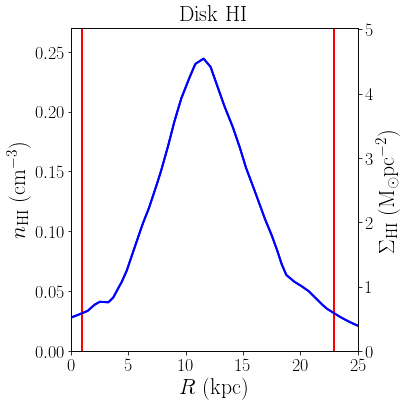

In [120]:
'''
Figure 5a

This figure shows HI gas density on the disk
The arrays come from plotting_astrophysical_models_sup.ipynb, 
which gets them from modeling_andromeda.ipynb
'''
tex_label = 'HI_gas'

#load arrays
R_grid = np.load(array_path + tex_label + '__R.npy')
H1_disk = np.load(array_path + tex_label + '__disk.npy')
H1_disk_density = np.load(array_path + tex_label + '__disk_density.npy')
R_bounds = np.load(array_path+tex_label + '__R_bounds.npy')

#make plot
fig = plt.figure()
ax1 = fig.add_subplot(111)
l1, = ax1.plot(R_grid, H1_disk_density, color='b')
ax1.set_xlim([0, 50])
H1_disk_density_max = np.max(H1_disk_density)
H1_disk_max = np.max(H1_disk)
ratio = H1_disk_max/H1_disk_density_max
max_density = 0.27
ax1lims = [0, max_density]
ax2lims = [lim*ratio for lim in ax1lims]
ax1.set_ylim(ax1lims)
ax1.set_title(r'Disk HI')
ax1.set_xlabel(r'$R \; \rm (kpc)$')
xticks = [0, 5, 10, 15, 20, 25]
ax1.set_xticks(xticks)
ax2 = ax1.twinx()
l2, = ax2.plot(R_grid, H1_disk, color='b')
ax2.set_ylim(ax2lims)
ax2.set_ylabel(r'$\Sigma_{\rm HI} \; \rm (M_\odot pc^{-2})$')
ax1.set_ylabel(r'$n_{\rm HI} \; \rm (cm^{-3})$')
ax1.axvline(x=R_bounds[0], color='r')
ax1.axvline(x=R_bounds[1], color='r')
ax1.set_xlim([Rmin, Rmax])
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

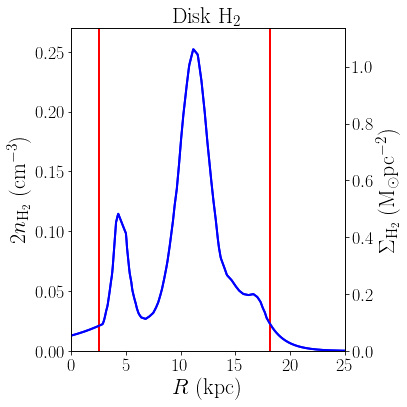

In [77]:
'''
Figure 5b

This figure shows H2 gas density on the disk
The arrays come from plotting_astrophysical_models_sup.ipynb, 
which gets them from modeling_andromeda.ipynb
'''
tex_label = 'H2_gas'

#load arrays
R_grid = np.load(array_path + tex_label + '__R.npy')
H2_disk = np.load(array_path + tex_label + '__disk.npy')
H2_disk_density = np.load(array_path + tex_label + '__disk_density.npy')
R_bounds = np.load(array_path+tex_label + '__R_bounds.npy')

#make plot
fig = plt.figure()
ax1 = fig.add_subplot(111)
l1, = ax1.plot(R_grid, H2_disk_density, color='b')
ax1.set_xlim([0, 50])
H2_disk_density_max = np.max(H2_disk_density)
H2_disk_max = np.max(H2_disk)
ratio = H2_disk_max/H2_disk_density_max
ax1lims = [0, max_density]
ax2lims = [lim*ratio for lim in ax1lims]
ax1.set_ylim(ax1lims)
ax1.set_title(r'Disk $\rm H_2$')
ax1.set_xlabel(r'$R \; \rm (kpc)$')
ax1.set_xticks(xticks)
ax2 = ax1.twinx()
l2, = ax2.plot(R_grid, H2_disk, color='b')
ax2.set_ylim(ax2lims)
ax2.set_ylabel(r'$\Sigma_{\rm H_2} \; \rm (M_\odot pc^{-2})$')
ax1.set_ylabel(r'$2n_{\rm H_2} \; \rm (cm^{-3})$')
ax1.axvline(x=R_bounds[0], color='r')
ax1.axvline(x=R_bounds[1], color='r')
ax1.set_xlim([Rmin, Rmax])
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')


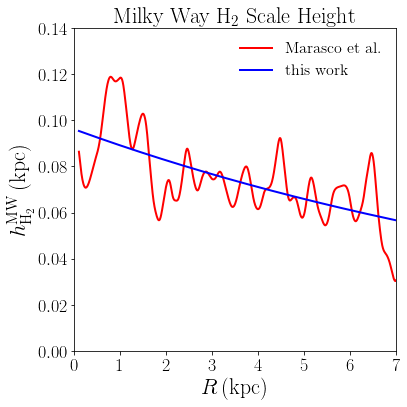

In [702]:
'''
Figure 6
This figure shows our fit to the MW H2 scale height from 1707.00743 along with the fit from that reference
arrays come from modeling_andromeda.ipynb
'''
tex_label='H2_scaleheight_MW'
names=['R', 'hz', 'hz0_Rhz']
R, their_hz, hz_params = load_arrays(array_path, tex_label, names)
#our_R = np.linspace(0, 25, 1000)
our_hz = hz_params[0]*np.exp(-R/hz_params[1])
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(R, their_hz, label=r'Marasco et al.', color='r')
ax.plot(R, our_hz, label=r'this work', color='b')
ax.set_xlabel(r'$R \, \rm (kpc)$')
ax.set_ylabel(r'$h_{\rm H_2}^{\rm MW} \, \rm (kpc)$')
ax.set_title(r'Milky Way $\rm H_2$ Scale Height')
Rticks = np.arange(0, 8)
ax.set_xlim([R[0], R[-1]])
ax.set_ylim([0, 0.14])
ax.set_xticks(Rticks)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

[{'file_name': '0002_electron_spectrum_info.txt', 'mx': 7.6, 'channel': 'bb_bar'}, {'file_name': '0009_electron_spectrum_info.txt', 'mx': 38.6, 'channel': 'bb_bar'}, {'file_name': '0015_electron_spectrum_info.txt', 'mx': 156.1, 'channel': 'bb_bar'}, {'file_name': '0021_electron_spectrum_info.txt', 'mx': 500.0, 'channel': 'bb_bar'}]


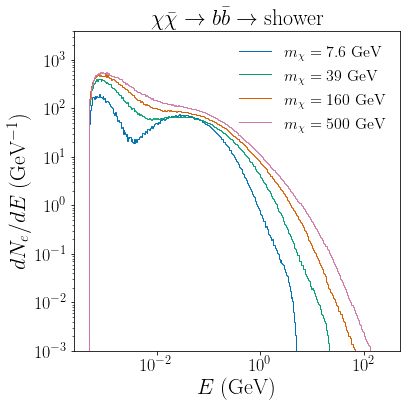

In [19]:
'''
Figure 7

This figure shows the electron spectrum from annihilations of b\bar{b}
The arrays come from compute_signal.py (main script)
'''
search = True
tex_label = 'electron_spectrum'
mx_set = np.round(np.logspace(np.log10(6), np.log10(500), 20), 1)
inds = np.array([1, 8, 14, 19])
mx = mx_set[inds]
if search:
    run_list = mt.find_results(0,  mx=mx_set[inds])
    print(run_list)
    espec_names = [run['file_name'].split('_info')[0]+'.npy' for run in run_list]
    bin_names = [run['file_name'].split('_info')[0]+'_bins.npy' for run in run_list]
    output_type = 'electron_spectrum/'
    bins_list = [np.load(base_path + output_type + bin_name) for bin_name in bin_names]
    espec_list = [np.load(base_path + output_type + espec_name) for espec_name in espec_names]

#c = ['k', 'b', 'r', 'g']
mx_round = np.array([np.round(m, 1-int(np.floor(np.log10(m)))) for m in mx])
mx_str = [str(m).rstrip("0").rstrip(".") if "." in str(m) else m for m in mx_round]
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(inds)):
    ax.stairs(espec_list[i], bins_list[i], label=r'$m_\chi= \;$' + str(mx_str[i]) + r' GeV') #, color=c[i])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim([10**(-3), 4e3])
ax.set_xlim([cf.me/2, 500])
ax.set_xlabel(r'$E \; \rm (GeV)$')
ax.set_ylabel(r'$dN_e/dE \; \rm (GeV^{-1})$')
ax.set_title(r'$\chi \bar{\chi} \rightarrow b \bar{b} \rightarrow \rm shower$')
ax.legend(frameon=False, fontsize = 16)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

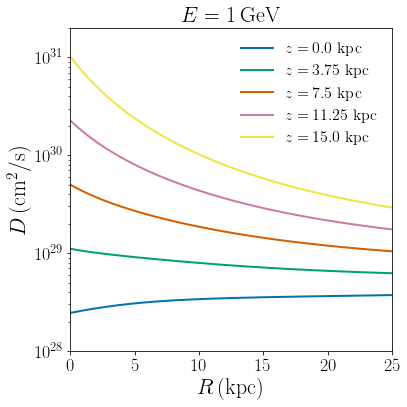

In [21]:
'''
Figure 8

This figure shows the diffusion coefficient as a function of R and z for E = 1 GeV. 
The arrays come from Andromeda5_plotting_sup.ipynb

'''

tex_label = 'diffusion_coef'

names = ['R', 'z', 'D']
R_ar, z_ar, D_ar = load_arrays(array_path, tex_label, names)
#c = ['k', 'b', 'r', 'c', 'm']
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(z_ar)):
    ax.plot(R_ar, D_ar[i], label=r'$z = \,$' + str(z_ar[i]) + r' kpc')#, color = c[i])
ax.set_yscale('log')
ax.set_ylim([1e28, 2e31])
ax.set_xlim([.001, 50])
ax.set_xlabel(r'$R \, \rm (kpc)$')
ax.set_ylabel(r'$D \, \rm (cm^2/s)$')
ax.set_title(r'$E = 1 \rm \, GeV$')
#xticks = [0, 10, 20, 30, 40, 50]
ax.set_xlim([Rmin, Rmax])
#ax.set_xticks(xticks)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

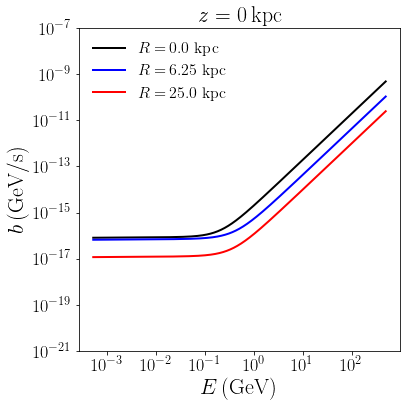

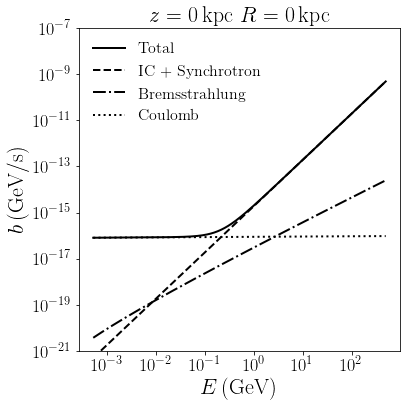

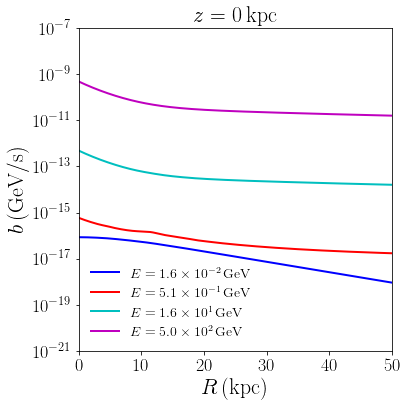

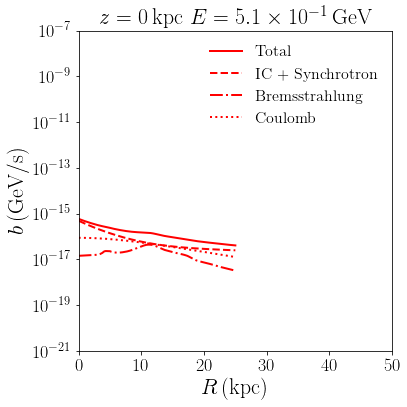

In [751]:
'''
Figure 9
Various plots of the loss coefficient. All arrays were generated in Andromeda5_plotting_sup.ipynb

Figure 9a
This figure shows the loss coefficient as a function of E and R for z = 0 kpc. 

'''
tex_label = 'loss_coef_ER'
names=['R', 'E', 'b']
R, E, b = load_arrays(array_path, tex_label, names)
Rinds = np.array([0, 1, 4])
fig = plt.figure()
ax = fig.add_subplot(111)
c = ['k', 'b', 'm', 'c', 'r']
for i in Rinds:
    ax.plot(E, b[:, i], label=r'$R = \, $' + str(R[i]) + r' kpc', color=c[i])
Eticks = [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel(r'$E \, \rm (GeV)$')
ax.set_ylabel(r'$b \, \rm (GeV/s)$')
ax.set_title(r'$z=0 \, \rm kpc $')
ax.set_xticks(Eticks)
ylim = [1e-21, 1e-7]
ax.set_ylim(ylim)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

'''
Figure 9b

This figure shows the loss coefficient as a function of E split 
into the contributions from different processes for R = 0 kpc and z = 0 kpc. 

'''

tex_label = 'loss_coef_Etype'
labels_load = ['tot', 'IC+sync', 'brem', 'C']
styles = ['solid', 'dashed', 'dashdot', 'dotted']
b_ar = load_arrays(array_path, tex_label, labels_load)
labels = ['Total', 'IC + Synchrotron', 'Bremsstrahlung', 'Coulomb']
E, R = load_arrays(array_path, tex_label, ['E', 'R'])
fig = plt.figure()
ax = fig.add_subplot(111)
for b,l,style in zip(b_ar, labels, styles):
    ax.plot(E, b[:, 0], label=l, linestyle=style, color='k')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel(r'$E \, \rm (GeV)$')
ax.set_ylabel(r'$b \, \rm (GeV/s)$')
ax.set_title(r'$z=0 \, \rm kpc \,\, $' + r'$R = 0 \, \rm kpc$' )
ax.set_xticks(Eticks)
ax.set_ylim(ylim)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

'''
Figure xx
This figure shows the loss coefficient as a function of E and R for z = 0 kpc. 

'''

tex_label = 'loss_coef_RE'
R, E, b = load_arrays(array_path, tex_label, ['R', 'E', 'b'])
labels = [r'$E = ' + latex_float(Ei, 1) + r' \, \rm GeV$' for Ei in E]
c = ['k', 'b', 'r', 'c', 'm']
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(1, len(E)):
    ax.plot(R, b[i, :], label=labels[i], color=c[i])
ax.set_yscale('log')
ax.set_xlabel(r'$R \, \rm (kpc)$')
ax.set_ylabel(r'$b \, \rm (GeV/s)$')
ax.set_title(r'$z = 0 \, \rm kpc $')
ax.set_xticks([0, 10, 20, 30, 40, 50])
ax.set_ylim(ylim)
ax.set_xlim([0, 50])
ax.legend(frameon=False, fontsize=14)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

'''
Figure xx

This figure shows the loss coefficient as a function of R split 
into the contributions from different processes for E = 0.51 GeV and z = 0 kpc. 

'''

tex_label = 'loss_coef_Rtype'
labels_load = ['tot', 'IC+sync', 'brem', 'C']
styles = ['solid', 'dashed', 'dashdot', 'dotted']
b_ar = load_arrays(array_path, tex_label, labels_load)
labels = ['Total', 'IC + Synchrotron', 'Bremsstrahlung', 'Coulomb']
E, R = load_arrays(array_path, tex_label, ['E', 'R'])
fig = plt.figure()
ax = fig.add_subplot(111)
for b,l,style in zip(b_ar, labels, styles):
    ax.plot(R, b[2,:], label=l, linestyle=style, color='r')
ax.set_yscale('log')
ax.set_xlabel(r'$R \, \rm (kpc)$')
ax.set_ylabel(r'$b \, \rm (GeV/s)$')
ax.set_title(r'$z = 0 \, \mathrm{kpc} \,\, E = ' + latex_float(E[2], 1) + r' \, \rm GeV$')
ax.set_xticks([0, 10, 20, 30, 40, 50])
ax.set_ylim(ylim)
ax.set_xlim([0, 50])
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

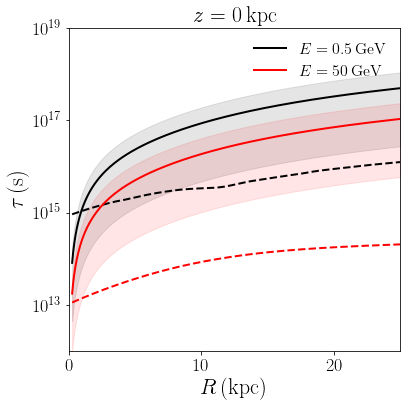

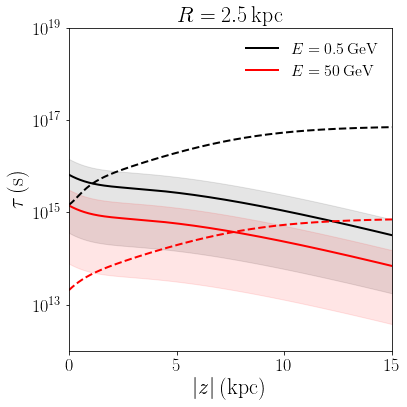

In [39]:
'''
Figure xx
The arrays were generated in Andromeda5_plotting_sup.ipynb
Figure xx
This figure shows loss and diffusion timescales as a function 
of R for various values of E
'''
tex_label='tauDvsb'
names = ['R', 'E', 'z', 'taub', 'tauD']
R, E, z, taub, tauD = load_arrays(array_path, tex_label, names)
Rmin = R[0]
Rmax = R[-1]
zmin = z[0]
zmax = z[-1]
taumin = 1e12
taumax = 1e19
D0 = np.array([5e27, 1.1e28, 2e29])
Einds=[0,2]
D0_bench = 3e28
fig = plt.figure()
ax = fig.add_subplot(111)
Elabels = [str(np.round(Eval, 1-int(np.floor(np.log10(Eval))))) +'end' for Eval in E]
Elabels = [El.split('.0end')[0] for El in Elabels]
Elabels = [El.split('end')[0] for El in Elabels]
for i in Einds:
    ax.plot(R[10:], (D0_bench/D0[1])*tauD[i, 0, 10:], linestyle='solid', color=c[i],\
            label= r'$E = ' + Elabels[i] + r'\, \rm GeV$')
    ax.fill_between(R[10:], (D0_bench/D0[0])*tauD[i, 0, 10:], (D0_bench/D0[2])*tauD[i, 0, 10:], color=c[i], alpha=.1)
    ax.plot(R[10:], taub[i, 0, 10:], linestyle='dashed', color=c[i], label='_nolegend_')
    
ax.set_yscale('log')
Rticks=[0,10,20,30, 40, 50]
ax.set_xticks(Rticks)
ax.set_xlim([Rmin, Rmax])
ax.set_ylim([taumin, taumax])
ax.set_xlabel(r'$R \, \rm (kpc)$')
ax.set_ylabel(r'$\tau \, \rm (s)$')
ax.set_title(r'$z=0\, \rm kpc$')
ax.legend(frameon=False)
fig.tight_layout()
tex_labela = tex_label+'a'
#fig.savefig(fig_path + tex_labela + '.pdf', format = 'pdf', bbox_inches='tight')

'''
Figure xx
This figure shows loss and diffusion timescales as a function 
of z for various values of E
'''
fig = plt.figure()
ax = fig.add_subplot(111)
jR = 100
for i in Einds:
    ax.plot(z, (D0_bench/D0[1])*tauD[i, :, jR], linestyle='solid', color=c[i],\
            label= r'$E = ' + Elabels[i] + r'\, \rm GeV$')
    ax.fill_between(z, (D0_bench/D0[0])*tauD[i, :, jR], (D0_bench/D0[2])*tauD[i, :, jR], color=c[i], alpha=.1)
    ax.plot(z, taub[i, :, jR], linestyle='dashed', color=c[i], label='_nolegend_')
    
ax.set_yscale('log')
zticks=[0,5,10,15]
ax.set_xticks(zticks)
ax.set_xlabel(r'$|z| \, \rm (kpc)$')
ax.set_ylabel(r'$\tau \, \rm (s)$')
ax.set_xlim([zmin, zmax])
ax.set_ylim([taumin, taumax])
ax.set_title(r'$R= ' + str(np.round(R[jR], 1)) + r'\, \rm kpc$')
ax.legend(frameon=False)
fig.tight_layout()
tex_labelb = tex_label+'b'
#fig.savefig(fig_path + tex_labelb + '.pdf', format = 'pdf', bbox_inches='tight')

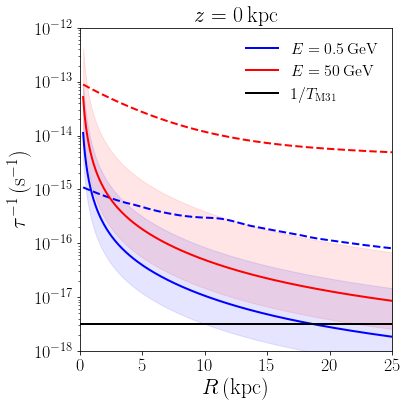

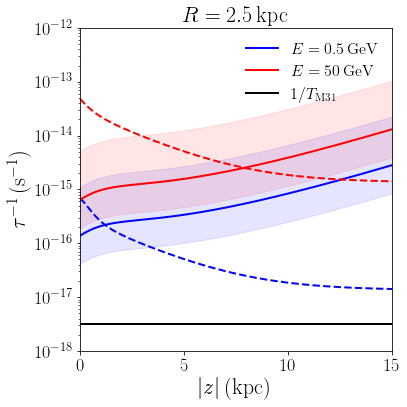

In [40]:
'''
Figure 10a
This figure shows loss and diffusion rates as a function 
of R for various values of E
The arrays come from Andromeda5_plotting_sup.ipynb
'''
tex_label='tauDvsb'
names = ['R', 'E', 'z', 'taub', 'tauD']
R, E, z, taub, tauD = load_arrays(array_path, tex_label, names)
#Rmin = R[0]
#Rmax = R[-1]
zmin = z[0]
zmax = z[-1]
taumin = 1e12
taumax = 1e18
#seconds in 10 billion years
tauM31 = 1e10*365.25*3600*24
D0 = np.array([3e27, 1e28, 3e28, 8e28])
Einds=[0,2]
c = ['b', 'k', 'r']
D0_bench = 3e28
fig = plt.figure()
ax = fig.add_subplot(111)
Elabels = [str(np.round(Eval, 1-int(np.floor(np.log10(Eval))))) +'end' for Eval in E]
Elabels = [El.split('.0end')[0] for El in Elabels]
Elabels = [El.split('end')[0] for El in Elabels]
for i in Einds:
    ax.plot(R[10:], ((D0_bench/D0[1])*tauD[i, 0, 10:])**(-1), linestyle='solid', color=c[i],\
            label= r'$E = ' + Elabels[i] + r'\, \rm GeV$')
    ax.fill_between(R[10:], ((D0_bench/D0[0])*tauD[i, 0, 10:])**(-1), ((D0_bench/D0[3])*tauD[i, 0, 10:])**(-1), color=c[i], alpha=.1)
    ax.plot(R[10:], taub[i, 0, 10:]**(-1), linestyle='dashed', color=c[i], label='_nolegend_')
ax.axhline(y = 1/tauM31, color = 'k', label=r'$1/T_{\rm M31}$')
ax.set_yscale('log')
Rticks=[0,10,20,30, 40, 50]
#ax.set_xticks(Rticks)
ax.set_xlim([Rmin, Rmax])
ax.set_ylim([taumax**(-1), taumin**(-1)])
ax.set_xlabel(r'$R \, \rm (kpc)$')
ax.set_ylabel(r'$\tau^{-1} \, \rm (s^{-1})$')
ax.set_title(r'$z=0\, \rm kpc$')
ax.legend(frameon=False)
fig.tight_layout()
tex_labela = tex_label+'a'
fig.savefig(fig_path + tex_labela + '.pdf', format = 'pdf', bbox_inches='tight')

'''
Figure 10b
This figure shows loss and diffusion timescales as a function 
of z for various values of E
The arrays come from Andromeda5_plotting_sup.ipynb
'''
fig = plt.figure()
ax = fig.add_subplot(111)
jR = 100
for i in Einds:
    ax.plot(z, ((D0_bench/D0[1])*tauD[i, :, jR])**(-1), linestyle='solid', color=c[i],\
            label= r'$E = ' + Elabels[i] + r'\, \rm GeV$')
    ax.fill_between(z, ((D0_bench/D0[0])*tauD[i, :, jR])**(-1), ((D0_bench/D0[3])*tauD[i, :, jR])**(-1), color=c[i], alpha=.1)
    ax.plot(z, taub[i, :, jR]**(-1), linestyle='dashed', color=c[i], label='_nolegend_')
ax.axhline(y = 1/tauM31, color = 'k', label=r'$1/T_{\rm M31}$')
    
ax.set_yscale('log')
zticks=[0,5,10,15]
ax.set_xticks(zticks)
ax.set_xlabel(r'$|z| \, \rm (kpc)$')
ax.set_ylabel(r'$\tau^{-1} \, \rm (s^{-1})$')
ax.set_xlim([zmin, zmax])
ax.set_ylim([taumax**(-1), taumin**(-1)])
ax.set_title(r'$R= ' + str(np.round(R[jR], 1)) + r'\, \rm kpc$')
ax.legend(frameon=False)
fig.tight_layout()
tex_labelb = tex_label+'b'
fig.savefig(fig_path + tex_labelb + '.pdf', format = 'pdf', bbox_inches='tight')

In [ ]:
'''
Figure 10a v2
This figure shows sum of dynamic rates as a function 
of R for various values of E
The arrays come from Andromeda5_plotting_sup.ipynb
'''
tex_label='tauDvsb'
names = ['R', 'E', 'z', 'taub', 'tauD']
R, E, z, taub, tauD = load_arrays(array_path, tex_label, names)
#Rmin = R[0]
#Rmax = R[-1]
zmin = z[0]
zmax = z[-1]
taumin = 1e12
taumax = 1e18
#seconds in 10 billion years
tauM31 = 1e10*365.25*3600*24
D0 = np.array([3e27, 1e28, 3e28, 8e28])
Einds=[0,2]
c = ['b', 'k', 'r']
D0_bench = 3e28
fig = plt.figure()
ax = fig.add_subplot(111)
Elabels = [str(np.round(Eval, 1-int(np.floor(np.log10(Eval))))) +'end' for Eval in E]
Elabels = [El.split('.0end')[0] for El in Elabels]
Elabels = [El.split('end')[0] for El in Elabels]
for i in Einds:
    ax.plot(R[10:], ((D0_bench/D0[1])*tauD[i, 0, 10:])**(-1), linestyle='solid', color=c[i],\
            label= r'$E = ' + Elabels[i] + r'\, \rm GeV$')
    ax.fill_between(R[10:], ((D0_bench/D0[0])*tauD[i, 0, 10:])**(-1), ((D0_bench/D0[3])*tauD[i, 0, 10:])**(-1), color=c[i], alpha=.1)
    ax.plot(R[10:], taub[i, 0, 10:]**(-1), linestyle='dashed', color=c[i], label='_nolegend_')
ax.axhline(y = 1/tauM31, color = 'k', label=r'$1/T_{\rm M31}$')
ax.set_yscale('log')
Rticks=[0,10,20,30, 40, 50]
#ax.set_xticks(Rticks)
ax.set_xlim([Rmin, Rmax])
ax.set_ylim([taumax**(-1), taumin**(-1)])
ax.set_xlabel(r'$R \, \rm (kpc)$')
ax.set_ylabel(r'$\tau^{-1} \, \rm (s^{-1})$')
ax.set_title(r'$z=0\, \rm kpc$')
ax.legend(frameon=False)
fig.tight_layout()
tex_labela = tex_label+'a' + '_sum'
fig.savefig(fig_path + tex_labela + '.pdf', format = 'pdf', bbox_inches='tight')

'''
Figure 10b
This figure shows loss and diffusion timescales as a function 
of z for various values of E
The arrays come from Andromeda5_plotting_sup.ipynb
'''
fig = plt.figure()
ax = fig.add_subplot(111)
jR = 100
for i in Einds:
    ax.plot(z, ((D0_bench/D0[1])*tauD[i, :, jR])**(-1), linestyle='solid', color=c[i],\
            label= r'$E = ' + Elabels[i] + r'\, \rm GeV$')
    ax.fill_between(z, ((D0_bench/D0[0])*tauD[i, :, jR])**(-1), ((D0_bench/D0[3])*tauD[i, :, jR])**(-1), color=c[i], alpha=.1)
    ax.plot(z, taub[i, :, jR]**(-1), linestyle='dashed', color=c[i], label='_nolegend_')
ax.axhline(y = 1/tauM31, color = 'k', label=r'$1/T_{\rm M31}$')
    
ax.set_yscale('log')
zticks=[0,5,10,15]
ax.set_xticks(zticks)
ax.set_xlabel(r'$|z| \, \rm (kpc)$')
ax.set_ylabel(r'$\tau^{-1} \, \rm (s^{-1})$')
ax.set_xlim([zmin, zmax])
ax.set_ylim([taumax**(-1), taumin**(-1)])
ax.set_title(r'$R= ' + str(np.round(R[jR], 1)) + r'\, \rm kpc$')
ax.legend(frameon=False)
fig.tight_layout()
tex_labelb = tex_label+'b' + '_sum'
fig.savefig(fig_path + tex_labelb + '.pdf', format = 'pdf', bbox_inches='tight')

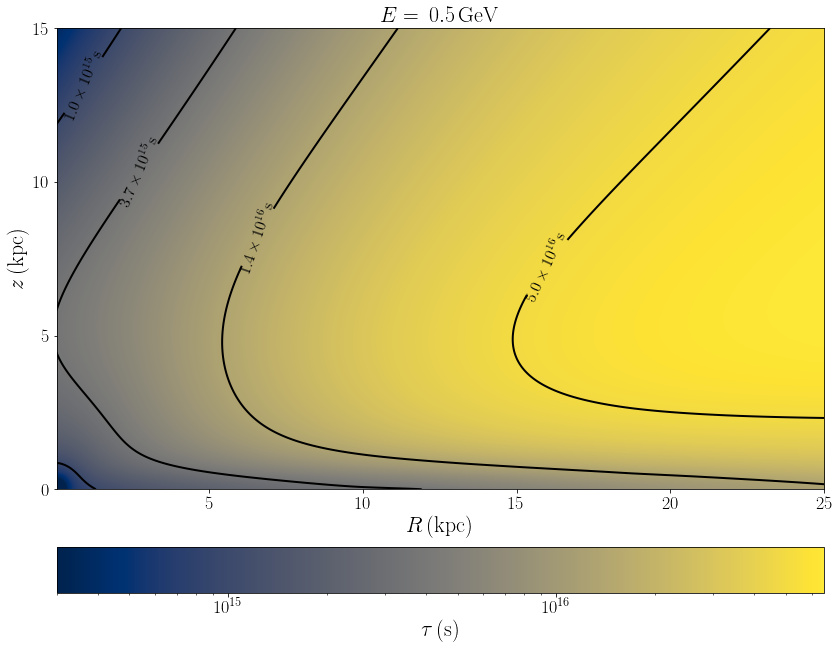

In [40]:
'''
Figure 11
image of dynamic time scale vs R, z
arrays are borrowed from the same place as tauDvsb
'''
tex_label='tau'
names = ['R', 'E', 'z', 'taub', 'tauD']
R, E, z, taub, tauD = load_arrays(array_path, tex_label, names)
RR, zz = np.meshgrid(R, z)
D0 = np.array([3e27, 1e28, 3e28, 8e28])
D0_bench = 3e28
iD = 0
iE = 0
tau = 1/((D0[iD]/D0_bench)*tauD**(-1)+taub**(-1))
tau.shape
this_tau = tau[iE, :, 1:]
min_tau = np.min(this_tau)
max_tau = np.max(this_tau)
tau_min = np.min(tau)
fig = plt.figure(figsize=(2*fig_width, 2*fig_width))
ax = fig.add_subplot(111)
im = ax.imshow(this_tau, extent=[R[1], R[-1], z[0], z[-1]], origin='lower', norm=LogNorm(vmin=3e14, vmax=max_tau))
levels = np.logspace(np.log10(1e15), np.log10(5e16), 4)
cont = ax.contour(RR[:, 1:], zz[:, 1:], tau[iE, :, 1:], levels, colors='k')
level_labels = {lev: r'$' + latex_float(lev, 1) + r'\, \rm s $' for lev in cont.levels}
locs = [(1.5, 13), (4, 10), (7.5, 8), (15, 7.5)]
ax.clabel(cont, inline=True, fontsize=16, fmt=level_labels, manual=locs)
divider = make_axes_locatable(ax)
cax = divider.append_axes('bottom', size='10%', pad=0.8)
ax.set_yticks([0, 5, 10, 15])
ax.set_xlabel(r'$R \, \rm{(kpc)}$')
ax.set_ylabel(r'$z \, \rm{(kpc)}$') 
ax.set_title(r'$E = \,' +str(np.round(E[iE], 1)) + r' \, \rm GeV$')
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.set_label(r'$\tau \, \rm(s)$')
cbar.ax.xaxis.set_ticks_position('bottom')
cbar.ax.xaxis.set_label_position('bottom')
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

In [27]:
print(np.log10(this_tau[0:10, 0:10]))

[[12.67695514 13.27042019 13.60979815 13.84312163 14.01715299 14.15302451
  14.26224415 14.35185533 14.42652406 14.48951876]
 [13.04892969 13.38879821 13.65985461 13.8672155  14.0294109  14.15938766
  14.2656108  14.35378111 14.42789478 14.49085487]
 [13.47040855 13.62233626 13.79085407 13.94512337 14.07832536 14.19154153
  14.28765154 14.36955148 14.43972892 14.50022473]
 [13.76018098 13.83798236 13.94014317 14.04729245 14.1491688  14.24174255
  14.32412698 14.39678766 14.46068218 14.51687982]
 [13.96839087 14.01351117 14.07822651 14.15232995 14.22825874 14.30148758
  14.36975121 14.43217702 14.48866233 14.53949367]
 [14.12623348 14.15486742 14.19806608 14.25039422 14.30699383 14.36426143
  14.41986327 14.47246441 14.52141861 14.56651661]
 [14.25082579 14.2702489  14.3004748  14.33847244 14.38119513 14.42605604
  14.47110695 14.51501568 14.55695293 14.59646144]
 [14.35224861 14.36612593 14.38814534 14.41653047 14.44934906 14.48480232
  14.52138973 14.55796191 14.59370109 14.62806726]


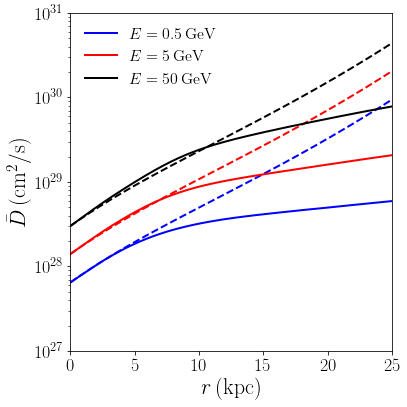

In [818]:
'''
Figure 12a
Spherically average diffusion coefficient for several energies as a function of r
arrays come from Andromeda5_plotting_sup.ipynb
'''
tex_label= 'weighted_vs_unweighted'
names = ['r', 'E', 'Dw', 'bw', 'Duw', 'buw']
r, E, Dw, bw, Duw, buw = load_arrays(array_path, tex_label, names)
Evals = np.array([.5, 5, 50])
inds = np.array([np.argmin(np.abs(Eval-E)) for Eval in Evals])
colors = ['b', 'r', 'k']
Rticks = 5*np.arange(0, 6)
Rlim = [Rmin, Rmax]
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(inds)):
    ax.plot(r, Dw[inds[i]], linestyle='solid', color=colors[i], label=r'$E = ' + round_sigfigs(E[inds[i]], 1) + r'\, \rm GeV$')
    ax.plot(r, Duw[inds[i]], linestyle='dashed', color=colors[i], label='_nolegend_')
ax.legend(frameon=False)
ax.set_yscale('log')
ax.set_xlabel(r'$r \, \rm (kpc)$')
ax.set_ylabel(r'$\bar{D} \, \rm (cm^2/s)$')
#ax.set_title(r'$D_0 = 1.1\times 10^{28} \, \rm cm^2/s$')
ax.set_xticks(Rticks)
ax.set_xlim(Rlim)
ax.set_ylim([1e27, 1e31])
tex_label_D = tex_label + 'D'
fig.tight_layout()
fig.savefig(fig_path + tex_label_D + '.pdf', format = 'pdf', bbox_inches='tight')

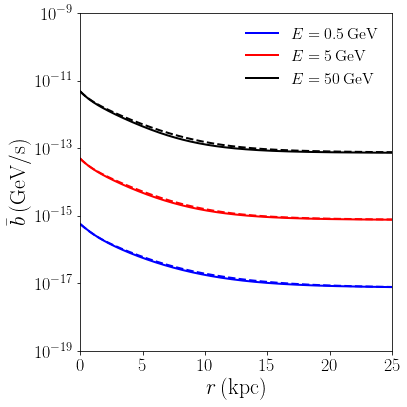

In [819]:
'''
Figure 12b
Spherically average loss coefficient for several energies as a function of r
arrays come from Andromeda5_plotting_sup.ipynb
'''
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(inds)):
    ax.plot(r, bw[inds[i]], linestyle='solid', color=colors[i], label=r'$E = ' + round_sigfigs(E[inds[i]], 1) + r'\, \rm GeV$')
    ax.plot(r, buw[inds[i]], linestyle='dashed', color=colors[i], label='_nolegend_')
ax.legend(frameon=False)
ax.set_yscale('log')
ax.set_xlabel(r'$r \, \rm (kpc)$')
ax.set_ylabel(r'$\bar{b} \, \rm (GeV/s)$')
#ax.set_title(r'Spherically Averaged')
ax.set_xticks(Rticks)
ax.set_xlim(Rlim)
ax.set_ylim([1e-19, 1e-9])
tex_label_b = tex_label + 'b'
fig.tight_layout()
fig.savefig(fig_path + tex_label_b + '.pdf', format = 'pdf', bbox_inches='tight')

ordering:  ['unweighted' 'weighted_dl']


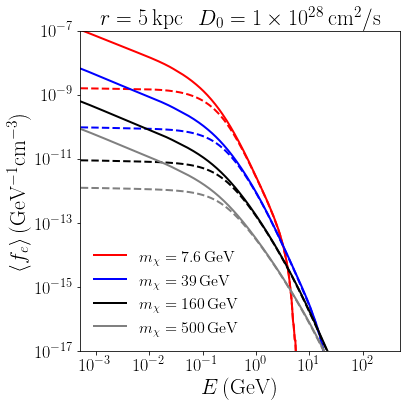

In [29]:
'''
Figure 13a
electron phasespace density as a function of E for different values of mx
arrays come from compute_signal_supplemental.ipynb
'''
tex_label='electron_phasespaceE_mx'
sph_avgs = ['unweighted', 'weighted_dl']
#this value of sigmav will apply for figures electron_phasespaceE_mx, electron_phasespacer_D0, 
#signal_mx, signal_D0, and signal
sigmav = 2.2e-25
sigmav_bench = 2.2e-26
sv_rat = sigmav/sigmav_bench
names = ['E', 'r', 'fe', 'mx', 'scheme']
E, r, fe, mx, schemes = load_arrays(array_path, tex_label, names)
print('ordering: ', schemes)
fe = np.einsum('lijk', fe)
m_inds = np.array([1, 8, 14, 19])
rind = 1
D0 = 1e28
mx_round = [round_sigfigs(mx[ind], 2) for ind in m_inds]
c = ['r', 'b', 'k', '.5']
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(m_inds)):
    ax.plot(E[m_inds[i], :], sv_rat*fe[0, m_inds[i], :, rind], color=c[i], linestyle='--')
    ax.plot(E[m_inds[i], :], sv_rat*fe[1, m_inds[i], :, rind], color=c[i], linestyle='-', label=r'$m_\chi = ' + mx_round[i] + r' \, \rm GeV$')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title(r'$r = ' + format(r[rind], '.0f') + r' \, \mathrm{kpc} \,\,\,\, D_0 = ' \
          + latex_float(D0, 0) + r'\, \rm cm^2/s$')
fe_lim_default = [1e-18, 1e-8]
fe_lim = [lim*sv_rat for lim in fe_lim_default]
ax.set_ylim(fe_lim)
Eticks = [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]
ax.set_xticks(Eticks)
ax.set_xlim([cf.me, mx[m_inds[-1]]])
ax.set_xlabel(r'$E \, \rm (GeV)$')
ax.set_ylabel(r'$\langle f_e\rangle \, \rm (GeV^{-1}cm^{-3})$')
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

ordering:  ['unweighted' 'weighted_dl']


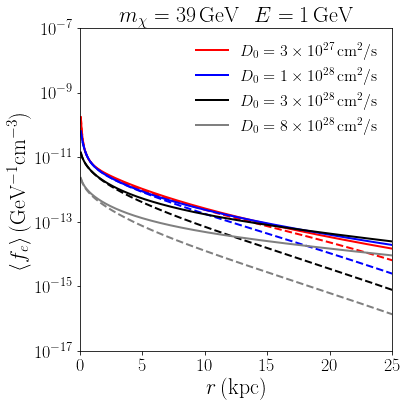

In [30]:
'''
Figure 13b
electron phasespace density as a function of r for different values of D0
arrays come from compute_signal_supplemental.ipynb
'''
tex_label = 'electron_phasespacer_D0'
names = ['r', 'fe', 'D0', 'E', 'mx', 'scheme']
r, fe, D0, E, mx, schemes = load_arrays(array_path, tex_label, names)
print('ordering: ', schemes)
rmax = 25
c = ['r', 'b', 'k', '.5']
mx_round = round_sigfigs(mx, 2)
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(D0)):
    ax.plot(r, sv_rat*fe[1, i, :], color = c[i], linestyle='-', label=r'$D_0 = ' + latex_float(D0[i], 0) + r'\, \rm cm^2/s $')
    ax.plot(r, sv_rat*fe[0, i, :], color=c[i], linestyle='--')
ax.set_yscale('log')
ax.set_title(r'$m_\chi = ' + mx_round + '\, \mathrm{GeV} \,\,\,\, E = ' + round_sigfigs(E, 1) + r'\, \rm GeV$')
ax.set_ylim(fe_lim)
#ax.set_ylim([1e-18, 1e-10])
ax.set_xlim([0, rmax])
ax.set_xlabel(r'$r \, \rm (kpc)$')
ax.set_ylabel(r'$\langle f_e\rangle \, \rm (GeV^{-1}cm^{-3})$')
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

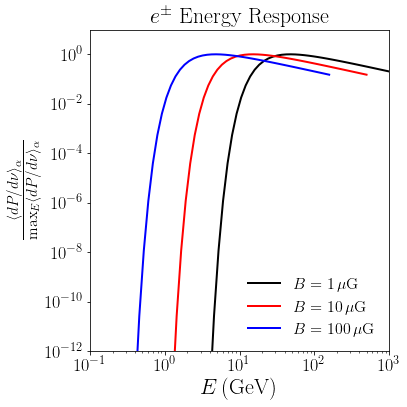

In [31]:
'''
Figure 14
power from a single particle averaged over pitch angle normailized so its max is 1 as function of E 
for different values of B
arrays come from Andromeda5_plotting_sup.ipynb
'''

tex_label='power'
names = ['E', 'x', 'power']
E, x, power = load_arrays(array_path, tex_label, names)
B = [1, 10, 100]
c = ['k', 'r', 'b']
fig = plt.figure()
ax = fig.add_subplot(111)
for i in range(len(B)):
    ax.plot(E/np.sqrt(B[i]/10), power, color=c[i], label=r'$B = ' + str(B[i]) + r' \, \rm \mu G$')
#ax.axvline(x=np.sqrt(x0/xcut), color='r')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim([1e-12, 10])
ax.set_xlim([1e-1, 1e3])
ax.set_xlabel(r'$E \, \rm (GeV)$')
ax.set_ylabel(r'$\frac{\langle dP/d\nu\rangle_\alpha}{\max_E \langle dP/d\nu\rangle_\alpha}$')
ax.set_title(r'$e^\pm$ Energy Response')
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

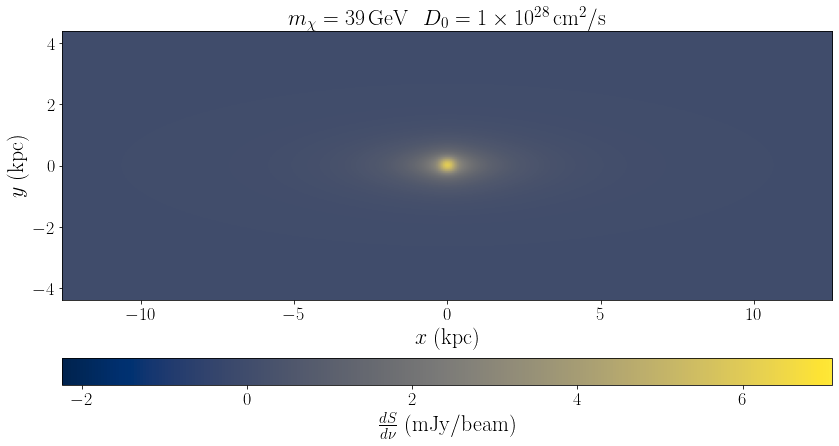

In [32]:
'''
Figure 15
synchrotron signal as a function of x for various values of mx
arrays come from compute_signal_supplemental.ipynb
'''
tex_label = 'signal'
names = ['x', 'y', 'flux', 'mx', 'D0']
xx, yy, flux, mx, D0 = load_arrays(array_path, tex_label, names)
title_str = r'$m_\chi = ' + round_sigfigs(mx[0], 2) + r'\, \mathrm{GeV} \,\,\,\, D_0 = '\
            + latex_float(D0[0], 0) + r'\, \rm cm^2/s$'
fig, _ = make_image_M31(sv_rat*flux, xx[0], yy[:, 0], minmax=[mindata, maxdata], title=title_str)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

ordering:  ['unweighted' 'weighted_dl']


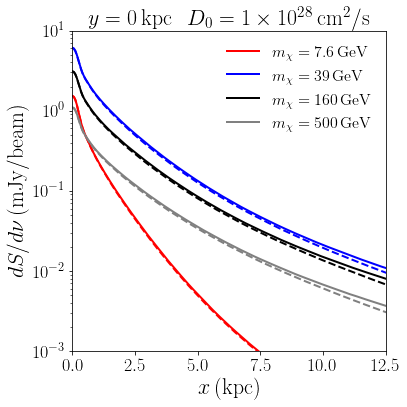

In [855]:
'''
Figure 16a
synchrotron signal as a function of x for various values of mx
arrays come from compute_signal_supplemental.ipynb
'''

tex_label = 'signal_mx'
names = ['x', 'y', 'flux', 'mx', 'scheme']
xx, yy, flux, mx, schemes = load_arrays(array_path, tex_label, names)
print('ordering: ', schemes)
D0 = 1e28
mx_round = [round_sigfigs(mx[i], 2) for i in range(len(mx))]
n, N = xx.shape
n0 = int((n-1)/2)
N0 = int((N-1)/2)
fig = plt.figure()
ax = fig.add_subplot(111)
c = ['r', 'b', 'k', '.5']
flux_lims_default = [1e-4, 1e0]
flux_lims = [lim*sv_rat for lim in flux_lims_default]
x_ticks = [0, 2.5, 5, 7.5, 10, 12.5]
xlims = [x_ticks[0], x_ticks[-1]]
for i in range(len(mx)):
    ax.plot(xx[0, N0:], sv_rat*flux[1, i, n0, N0:], color = c[i], linestyle='-', label=r'$m_\chi = ' + mx_round[i] + r'\, \rm GeV$')
    #uncomment next line when unweighted jobs are done
    ax.plot(xx[0, N0:], sv_rat*flux[0, i, n0, N0:], color = c[i], linestyle='--')
ax.set_yscale('log')
ax.set_title(r'$y = 0 \, \mathrm{kpc} \,\,\,\, D_0 =' + latex_float(D0, 0) + r'\, \rm cm^2/s$')
ax.set_xlabel(r'$x \, \rm (kpc)$')
ax.set_ylabel(r'$dS/d\nu \, \rm (mJy/beam)$')
ax.set_ylim(flux_lims)
ax.set_xticks(x_ticks)
ax.set_xlim(xlims)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

ordering:  ['unweighted' 'weighted_dl']


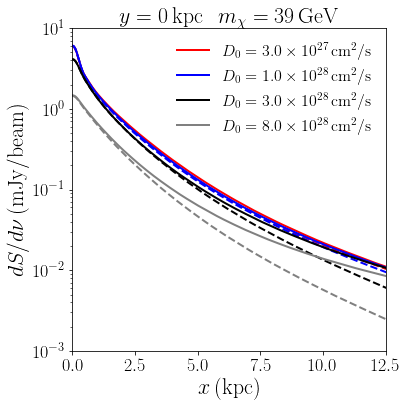

In [844]:
'''
Figure 16b
synchrotron signal as a function of x for various values of D0
arrays come from compute_signal_supplemental.ipynb
'''
tex_label = 'signal_D0'
names = ['x', 'y', 'flux', 'D0', 'scheme']
xx, yy, flux, D0, schemes = load_arrays(array_path, tex_label, names)
print('ordering: ', schemes)
D0_str = [latex_float(d0, 1) for d0 in D0]
n, N = xx.shape
n0 = int((n-1)/2)
N0 = int((N-1)/2)
fig = plt.figure()
ax = fig.add_subplot(111)
c = ['r', 'b', 'k', '.5']
for i in range(len(D0)):
    ax.plot(xx[0, N0:], sv_rat*flux[1, i, n0, N0:], color = c[i], linestyle='-', label=r'$D_0 = ' + D0_str[i] + r'\, \rm cm^2/s$')
    ax.plot(xx[0, N0:], sv_rat*flux[0, i, n0, N0:], color = c[i], linestyle='--')
ax.set_yscale('log')
ax.set_title(r'$y = 0 \, \mathrm{kpc} \,\,\,\, m_\chi =' + mx_round[1] + r'\, \rm GeV$')
ax.set_xlabel(r'$x \, \rm (kpc)$')
ax.set_ylabel(r'$dS/d\nu \, \rm (mJy/beam)$')
ax.set_ylim(flux_lims)
ax.set_xticks(x_ticks)
ax.set_xlim(xlims)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

center mask size:  0.9314288829105184


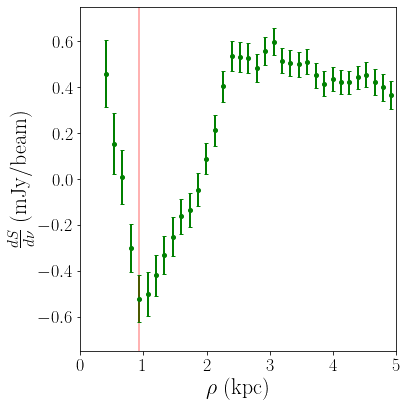

In [857]:
'''
Figure 17
synchrotron flux averaged over circular annuli to find the radius of the center mask
arrays come from Stats_method4.ipynb
'''
tex_label = 'annulus_averaged'
names = ['flux', 'err', 'rho']
flux, err, rho = load_arrays(array_path, tex_label, names)
ind = np.argmin(flux)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.axvline(x=rho[ind], color='r', alpha=.3)
#ax.scatter(rho[3:], flux[3:], color='g')
ax.errorbar(rho[3:], flux[3:], yerr=err[3:], color='g', capsize=2, fmt='o')
ax.set_ylim([-0.75, 0.75])
ax.set_xlabel(r'$\rho \; \rm{(kpc)}$')
ax.set_ylabel(r'$\frac{dS}{d\nu}\; \rm{(mJy/beam)}$')
#ax.set_title(r'Annulus-Averaged Flux')
rholim = [0, 5]
ax.set_xlim(rholim)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')
print('center mask size: ', rho[ind])

search region semi major axis:  8.220501205674614


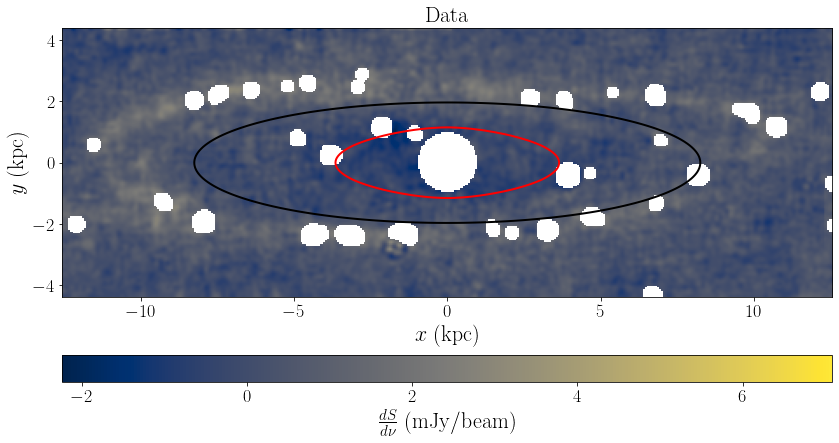

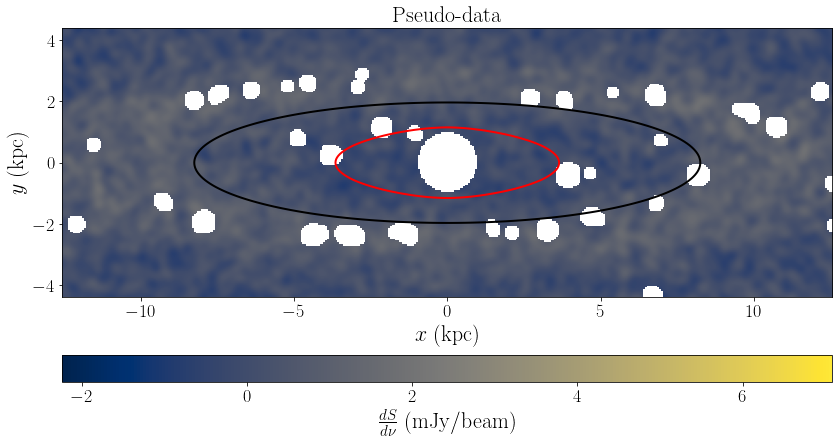

In [33]:
'''
Figure 18a
intensity map of data with point sources and center masked and contours showing the boundaries of other masks
arrays come from Stats_method4.ipynb
'''
tex_label = 'data_basemask'
names = ['data', 'base_mask', 'x', 'y', 'ell_params', 'test_sig', 'resid', 'wfin', 'levs']
data, base_mask, x, y, ell_params, test_signal, resid, w_fin, levs = load_arrays(array_path, tex_label, names)
mindata = np.min(data)
maxdata = np.max(data)
nsig_search = 1
elld_search = np.sqrt(x**2+(ell_params[0]**2)*y**2)
ind_sig = 4
lev_signal = levs[ind_sig]
lev_search = ell_params[1]-nsig_search*ell_params[2]
ma_data = ma.array(data, mask=np.logical_not(base_mask))
fig, ax = make_image_M31(ma_data, x[0], y[:, 0], minmax=[mindata, maxdata], title=r'Data')
cont_sig = ax.contour(x, y, test_signal, [np.array(lev_signal)], colors='r')
cont_sea = ax.contour(x, y, elld_search, [np.array(lev_search)], colors='k')
#level_labels_sig = {lev: r'signal region' for lev in cont_sig.levels}
#ax.clabel(cont_sig, inline=True, fontsize=16, fmt=level_labels_sig)
#level_labels_sea = {lev: r'search region' for lev in cont_sea.levels}
#ax.clabel(cont_sea, inline=True, fontsize=16, fmt=level_labels_sea)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

'''
Figure 18b
same as 18a but for pseudodata
arrays come from Stats_method4.ipynb
'''

#pseudo data figure
tex_label = 'pseudo' + tex_label
model = background([x,y], w_fin)
pseudodata = model + resid
ma_pseudodata = ma.array(pseudodata, mask=np.logical_not(base_mask))
fig, ax = make_image_M31(ma_pseudodata, x[0], y[:, 0], minmax=[mindata, maxdata], title=r'Pseudo-data')
cont_sig = ax.contour(x, y, test_signal, [np.array(lev_signal)], colors='r')
cont_sea = ax.contour(x, y, elld_search, [np.array(lev_search)], colors='k')
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')
print('search region semi major axis: ', np.max(x[np.where(elld_search<lev_search)]))

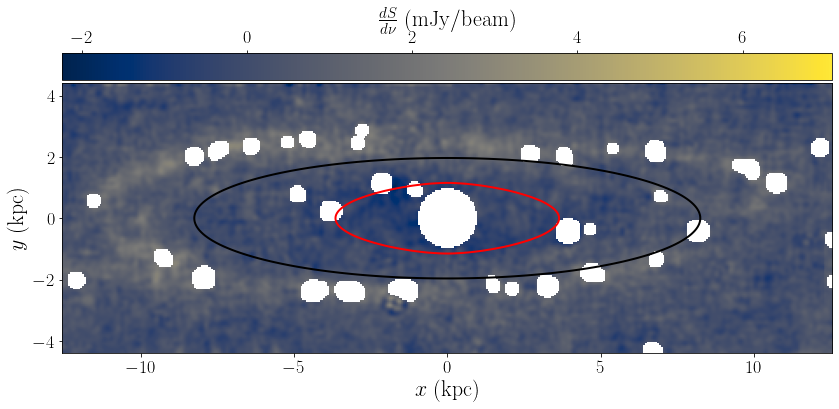

In [34]:
'''
Figure 18a v2
intensity map of data with point sources and center masked and contours showing the boundaries of other masks
arrays come from Stats_method4.ipynb
'''
tex_label = 'data_basemask'
names = ['data', 'base_mask', 'x', 'y', 'ell_params', 'test_sig', 'resid', 'wfin', 'levs']
data, base_mask, x, y, ell_params, test_signal, resid, w_fin, levs = load_arrays(array_path, tex_label, names)
mindata = np.min(data)
maxdata = np.max(data)
nsig_search = 1
elld_search = np.sqrt(x**2+(ell_params[0]**2)*y**2)
ind_sig = 4
lev_signal = levs[ind_sig]
lev_search = ell_params[1]-nsig_search*ell_params[2]
ma_data = ma.array(data, mask=np.logical_not(base_mask))
fig, ax = make_image_M31(ma_data, x[0], y[:, 0], minmax=[mindata, maxdata])
cont_sig = ax.contour(x, y, test_signal, [np.array(lev_signal)], colors='r')
cont_sea = ax.contour(x, y, elld_search, [np.array(lev_search)], colors='k')
#level_labels_sig = {lev: r'signal region' for lev in cont_sig.levels}
#ax.clabel(cont_sig, inline=True, fontsize=16, fmt=level_labels_sig)
#level_labels_sea = {lev: r'search region' for lev in cont_sea.levels}
#ax.clabel(cont_sea, inline=True, fontsize=16, fmt=level_labels_sea)
fig.tight_layout()
tex_label += '_v2'
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

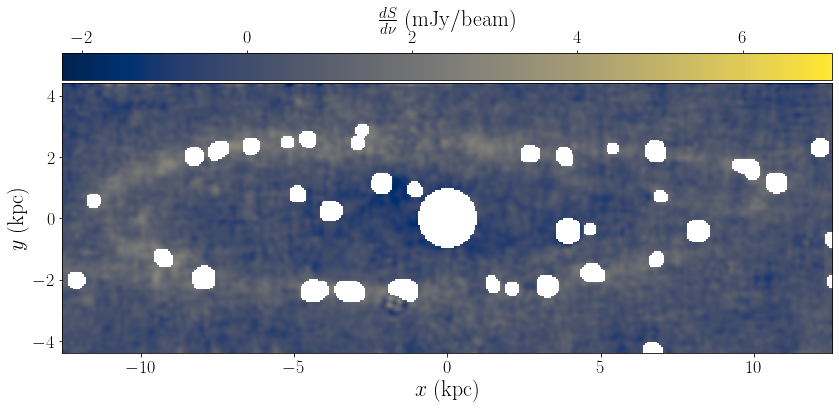

In [35]:
'''
Figure 18a no contours v2
intensity map of data with point sources and center masked and contours showing the boundaries of other masks
arrays come from Stats_method4.ipynb
'''
tex_label = 'data_basemask'
names = ['data', 'base_mask', 'x', 'y', 'ell_params', 'test_sig', 'resid', 'wfin', 'levs']
data, base_mask, x, y, ell_params, test_signal, resid, w_fin, levs = load_arrays(array_path, tex_label, names)
mindata = np.min(data)
maxdata = np.max(data)
nsig_search = 1
elld_search = np.sqrt(x**2+(ell_params[0]**2)*y**2)
ind_sig = 4
lev_signal = levs[ind_sig]
lev_search = ell_params[1]-nsig_search*ell_params[2]
ma_data = ma.array(data, mask=np.logical_not(base_mask))
fig, ax = make_image_M31(ma_data, x[0], y[:, 0], minmax=[mindata, maxdata])
#cont_sig = ax.contour(x, y, test_signal, [np.array(lev_signal)], colors='r')
#cont_sea = ax.contour(x, y, elld_search, [np.array(lev_search)], colors='k')
#level_labels_sig = {lev: r'signal region' for lev in cont_sig.levels}
#ax.clabel(cont_sig, inline=True, fontsize=16, fmt=level_labels_sig)
#level_labels_sea = {lev: r'search region' for lev in cont_sea.levels}
#ax.clabel(cont_sea, inline=True, fontsize=16, fmt=level_labels_sea)
fig.tight_layout()
tex_label += '_nocontours_v2'
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

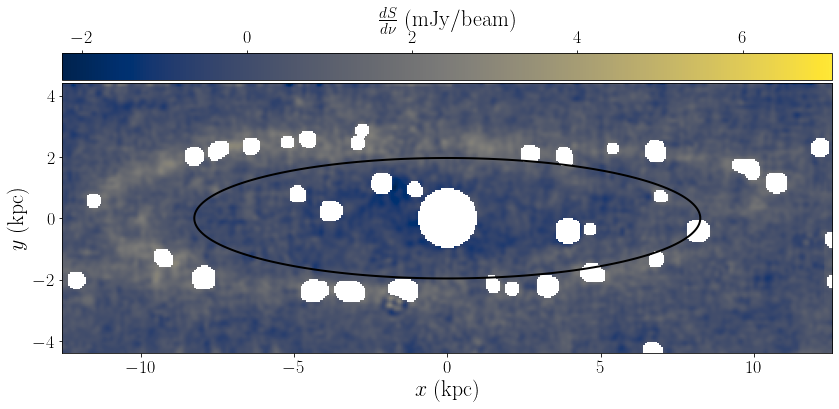

In [36]:
'''
Figure 18a no signal region v2
intensity map of data with point sources and center masked and contours showing the boundaries of other masks
arrays come from Stats_method4.ipynb
'''
tex_label = 'data_basemask'
names = ['data', 'base_mask', 'x', 'y', 'ell_params', 'test_sig', 'resid', 'wfin', 'levs']
data, base_mask, x, y, ell_params, test_signal, resid, w_fin, levs = load_arrays(array_path, tex_label, names)
nsig_search = 1
elld_search = np.sqrt(x**2+(ell_params[0]**2)*y**2)
ind_sig = 4
lev_signal = levs[ind_sig]
lev_search = ell_params[1]-nsig_search*ell_params[2]
ma_data = ma.array(data, mask=np.logical_not(base_mask))
fig, ax = make_image_M31(ma_data, x[0], y[:, 0], minmax=[mindata, maxdata])
#cont_sig = ax.contour(x, y, test_signal, [np.array(lev_signal)], colors='r')
cont_sea = ax.contour(x, y, elld_search, [np.array(lev_search)], colors='k')
#level_labels_sig = {lev: r'signal region' for lev in cont_sig.levels}
#ax.clabel(cont_sig, inline=True, fontsize=16, fmt=level_labels_sig)
#level_labels_sea = {lev: r'search region' for lev in cont_sea.levels}
#ax.clabel(cont_sea, inline=True, fontsize=16, fmt=level_labels_sea)
fig.tight_layout()
tex_label += '_nosignal_v2'
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

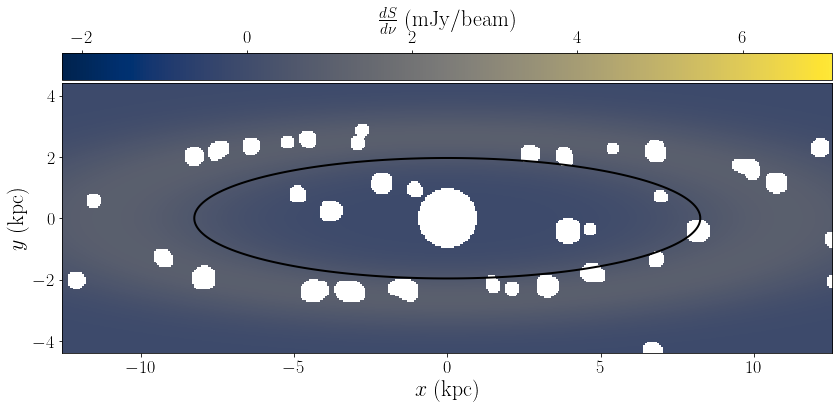

In [37]:
'''
supplemental plot: model
intensity map of data with point sources and center masked and contours showing the boundaries of other masks
arrays come from Stats_method4.ipynb
'''
tex_label = 'back_model_map'
model = load_arrays(array_path, tex_label, ['flux'])[0]
nsig_search = 1
elld_search = np.sqrt(x**2+(ell_params[0]**2)*y**2)
ind_sig = 4
lev_signal = levs[ind_sig]
lev_search = ell_params[1]-nsig_search*ell_params[2]
ma_data = ma.array(model, mask=np.logical_not(base_mask))
fig, ax = make_image_M31(ma_data, x[0], y[:, 0], minmax=[mindata, maxdata])
#cont_sig = ax.contour(x, y, test_signal, [np.array(lev_signal)], colors='r')
cont_sea = ax.contour(x, y, elld_search, [np.array(lev_search)], colors='k')
#level_labels_sig = {lev: r'signal region' for lev in cont_sig.levels}
#ax.clabel(cont_sig, inline=True, fontsize=16, fmt=level_labels_sig)
#level_labels_sea = {lev: r'search region' for lev in cont_sea.levels}
#ax.clabel(cont_sea, inline=True, fontsize=16, fmt=level_labels_sea)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

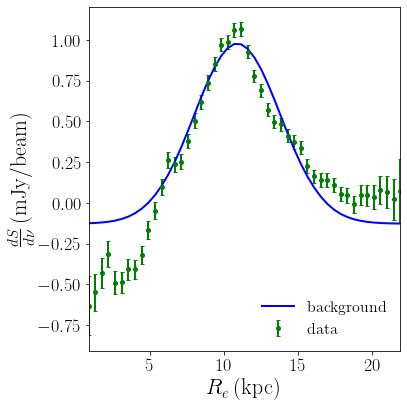

In [45]:
'''
Figure 19
flux and background model (with global fit) averaged over elliptical annuli with aspect ratio given by 1/cos(beta)
arrays come from Stats_method4.ipynb
'''

tex_label='radial_flux'
names = ['bins', 'flux', 'model', 'err']
bins, flux, model, err = load_arrays(array_path, tex_label, names)
fig = plt.figure()
ax = fig.add_subplot(111)
#ax.scatter(bins[0:-1], flux, s = 4, color='g', label=r'data')
start = 2
ax.errorbar(bins[0:-1], flux, yerr=err, color='g', fmt='o', capsize=2, label=r'data')
ax.plot(bins[start:-1], model[start:], color='b', label=r'background')
sm_search = ell_params[1]-ell_params[2]
ax.axvline(x=sm_search, color='k', label=r'search')
ax.set_xlabel(r'$R_e \, \rm (kpc)$')
ax.set_ylabel(r'$\frac{dS}{d\nu} \, \rm (mJy/beam)$')
ax.legend(frameon=False)

Rticks = [5, 10, 15, 20]
ax.set_xticks(Rticks)
ax.set_xlim([bins[start], np.max(bins[:-1])])
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

3.6535560914109393


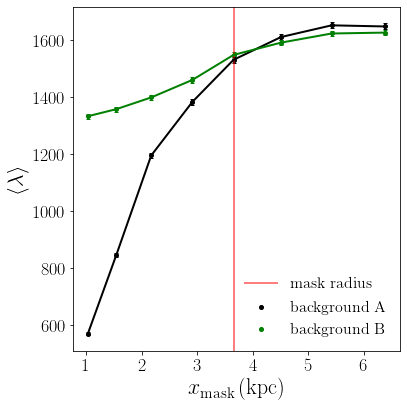

In [858]:
'''
Figure 20
mean test statistic for simulated maps assuming two different background hypotheses 
arrays come from Stats_method4.ipynb
'''
tex_label = 'mean_ts'
names = ['Re', 'TS_A', 'TS_B', 'err_A', 'err_B']
Rmask, TSA, TSB, errA, errB = load_arrays(array_path, tex_label, names)
print(Rmask[4])
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(Rmask[:-2], TSA[:-2], color='k', label=r'background A')
ax.errorbar(Rmask[:-2], TSA[:-2], yerr=errA[:-2], color='k',  capsize=2)
ax.scatter(Rmask[:-2], TSB[:-2], color='g', label=r'background B')
ax.errorbar(Rmask[:-2], TSB[:-2], yerr=errB[:-2], color='g', capsize=2)
ax.axvline(x=Rmask[4], color='r', label='mask radius', alpha=.5)
ax.set_xlabel(r'$x_{\rm mask} \, \rm (kpc)$')
ax.set_ylabel(r'$\langle \lambda \rangle$')
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

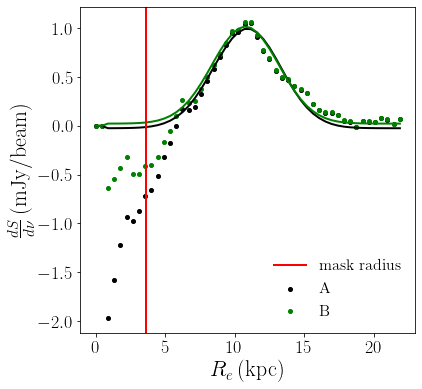

In [614]:
'''
Figure xx
comparison of fits from background models A and B with chosen signal region mask size
arrays come from Stats_method4.ipynb
'''
tex_label = 'compare_fits'
names = ['bins', 'model', 'data', 'mask_size']
bins, model, data, mask_size = load_arrays(array_path, tex_label, names)
labels=['A', 'B']
colors=['k', 'g']
fig = plt.figure()
ax = fig.add_subplot(111)
[ax.scatter(bins[:-1], d, label=l, color=c) for c,l,d in zip(colors, labels, data)]
[ax.plot(bins[:-1], m, color=c) for c,m in zip(colors, model)]
ax.axvline(x=mask_size, color='r', label='mask radius')
ax.set_xlabel(r'$R_e \, \rm (kpc)$')
ax.set_ylabel(r'$\frac{dS}{d\nu} \, \rm (mJy/beam)$')
ax.legend(frameon=False)

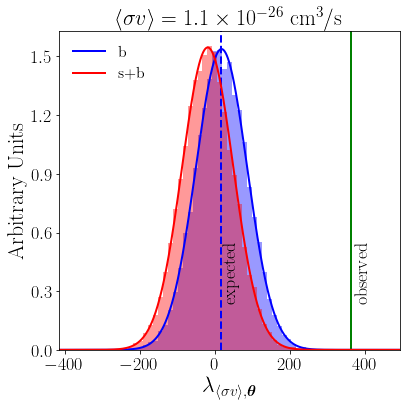

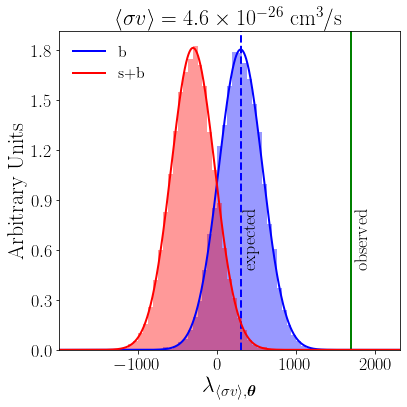

In [79]:
'''
Figure 21 a & c
distributions of CLb and CLs+b for an excluded signal and a signal that is expected to be excluded
arrays come from Stats_method4.ipynb
'''
tex_label='CL_hist'

names = ['dchib', 'dchisb', 'bins', 'dchi_data', 'dchib_mean', 'dchi_full', 'pdf_b', 'pdf_sb', 'sigmav']
dchib, dchisb, bins, dchi_data, dchib_mean, dchi_full, pdf_b, pdf_sb, sigmav = load_arrays(array_path, tex_label, names)
end = ['_' + str(i+1) for i in range(len(sigmav))]
N = 20000
rescaler = 1000
delta_bins = [b[1]-b[0] for b in bins]
xy_obs = [(375, 250/rescaler), (1750, 500/rescaler)]
xy_exp = [(25, 250/rescaler), (350, 500/rescaler)]
rescaler = 1000
yticks = [np.linspace(0, 1.5, 6), np.linspace(0, 1.8, 7)]
for i in range(len(sigmav)):
    tex_label_final = tex_label+ end[i]
    fig = plt.figure()
    ax = fig.add_subplot(111)
    frq, edges = np.histogram(dchib[i], bins=bins[i], density=False)
    ax.bar(edges[:-1], frq/rescaler, width=np.diff(edges), align="edge", alpha=.4, color='b')
    frq, edges = np.histogram(dchisb[i], bins=bins[i], density=False)
    ax.bar(edges[:-1], frq/rescaler, width=np.diff(edges), align="edge", alpha=.4, color='r')
    ax.axvline(x=dchi_data[i], color='g')
    ax.axvline(x=dchib_mean[i], color='b', linestyle='--')
    ax.plot(dchi_full[i], delta_bins[i]*N*pdf_b[i]/rescaler, label='b', color='b')
    ax.plot(dchi_full[i], delta_bins[i]*N*pdf_sb[i]/rescaler, label='s+b', color='r')
    ax.text(*xy_obs[i], r'observed', rotation=90)
    ax.text(*xy_exp[i], r'expected', rotation=90)
    ax.set_title(r'$\langle\sigma v\rangle=' + latex_float(sigmav[i], 1) + r'\;\rm{cm^3/s}$')
    ax.set_xlabel(r'$\lambda_{\langle \sigma v\rangle , \boldsymbol{\theta}}$')
    ax.set_ylabel(r'Arbitrary Units')
    xmin = dchi_full[i][0]
    xmax = dchi_full[i][-1]
    ax.set_xlim([xmin, xmax])
    ax.set_yticks(yticks[i])
    ax.legend(frameon=False, loc='upper left')
    #ax.ticklabel_format(axis='y', style='sci', scilimits=(-2, 2))
    fig.tight_layout()
    fig.savefig(fig_path + tex_label_final + '.pdf', format = 'pdf', bbox_inches='tight')


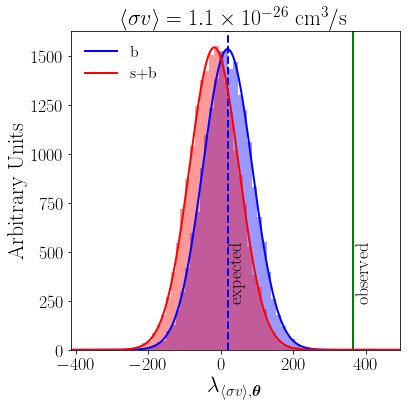

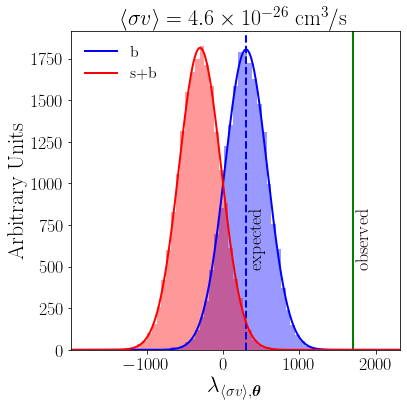

In [31]:
'''
Figure 21 a & c
distributions of CLb and CLs+b for an excluded signal and a signal that is expected to be excluded
arrays come from Stats_method4.ipynb

tex_label='CL_hist'

names = ['dchib', 'dchisb', 'bins', 'dchi_data', 'dchib_mean', 'dchi_full', 'pdf_b', 'pdf_sb', 'sigmav']
dchib, dchisb, bins, dchi_data, dchib_mean, dchi_full, pdf_b, pdf_sb, sigmav = load_arrays(array_path, tex_label, names)
end = ['_' + str(i+1) for i in range(len(sigmav))]
N = 20000
delta_bins = [b[1]-b[0] for b in bins]
xy_obs = [(375, 250), (1750, 500)]
xy_exp = [(25, 250), (350, 500)]
rescaler = 1000

for i in range(len(sigmav)):
    tex_label_final = tex_label+ end[i]
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.hist(dchib[i], bins=bins[i], alpha=.4, color='b', density=False)
    ax.hist(dchisb[i], bins=bins[i], alpha=.4, color='r', density=False)
    ax.axvline(x=dchi_data[i], color='g')
    ax.axvline(x=dchib_mean[i], color='b', linestyle='--')
    ax.plot(dchi_full[i], delta_bins[i]*N*pdf_b[i], label='b', color='b')
    ax.plot(dchi_full[i], delta_bins[i]*N*pdf_sb[i], label='s+b', color='r')
    ax.text(*xy_obs[i], r'observed', rotation=90)
    ax.text(*xy_exp[i], r'expected', rotation=90)
    ax.set_title(r'$\langle\sigma v\rangle=' + latex_float(sigmav[i], 1) + r'\;\rm{cm^3/s}$')
    ax.set_xlabel(r'$\lambda_{\langle \sigma v\rangle , \boldsymbol{\theta}}$')
    ax.set_ylabel(r'Arbitrary Units')
    xmin = dchi_full[i][0]
    xmax = dchi_full[i][-1]
    ax.set_xlim([xmin, xmax])
    #ax.set_yticks([])
    ax.legend(frameon=False, loc='upper left')
    #ax.ticklabel_format(axis='y', style='sci', scilimits=(-2, 2))
    fig.tight_layout()
    fig.savefig(fig_path + tex_label_final + '.pdf', format = 'pdf', bbox_inches='tight')
    
'''

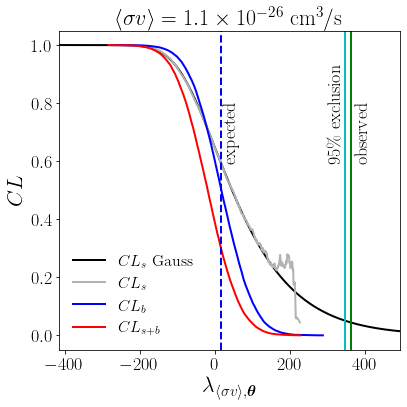

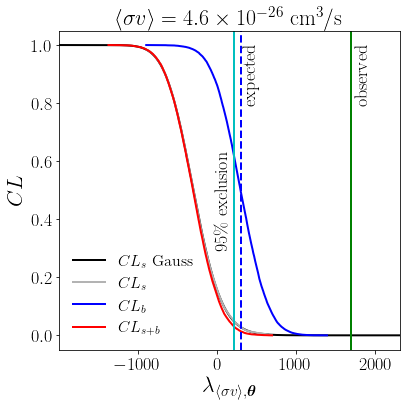

In [773]:
'''
Figure 21 b & d
CL curves for the same signals as in 21a&c with benchmark test statistics labeled
arrays come from Stats_method4.ipynb
'''

tex_label='CL_curves'

names = ['CLs_gauss', 'CLs', 'dchi_full', 'dchib_srt', 'dchisb_srt', 'perc_b', 'perc_sb', 'dchi_array', 'dchi_data', 'ind95', 'dchib_mean', 'sigmav']

xy_obs = [(375, .6), (1750, .8)]
xy_exp = [(25, .6), (350, .8)]
xy_95 = [(300, .6), (-25, .3)]

CLs_gauss, CLs, dchi_full, dchib_srt, dchisb_srt, perc_b, perc_sb, dchi_array, dchi_data, \
ind95, dchib_mean, sigmav = load_arrays(array_path, tex_label, names)
for i in range(len(CLs_gauss)):
    tex_label_final = tex_label + end[i]
    fig = plt.figure()
    ax = fig.add_subplot(111)
    #plt.plot(dchi_full, CL_b_gauss, label=r'$CL_b$', color='b')
    #plt.plot(dchi_full, CL_sb_gauss, label=r'$CL_{s+b}$', color='r')
    ax.plot(dchi_full[i], CLs_gauss[i], label=r'$CL_s$ Gauss', color='k')
    ax.plot(dchi_array[i], CLs[i], label=r'$CL_s$', color='.7')
    #plt.plot(dchi_array, CL_s, label=r'$CL_s$', color='.5')
    ax.plot(dchib_srt[i], 1-perc_b[i], label=r'$CL_b$', color='b')
    ax.plot(dchisb_srt[i], 1-perc_sb[i], label=r'$CL_{s+b}$', color='r')
    xmin = dchi_full[i][0]
    xmax = dchi_full[i][-1]
    ax.set_xlim([xmin, xmax])
    ax.text(*xy_obs[i], r'observed', rotation=90)
    ax.text(*xy_exp[i], r'expected', rotation=90)
    ax.text(*xy_95[i], r'$95\%$ exclusion', rotation=90)
    ax.set_title(r'$\langle\sigma v\rangle=' + latex_float(sigmav[i], 1) + r'\;\rm{cm^3/s}$')
    ax.set_xlabel(r'$\lambda_{\langle \sigma v\rangle , \boldsymbol{\theta}}$')
    ax.set_ylabel(r'$CL$')
    ax.axvline(x=dchi_data[i], color='g')
    ax.axvline(x=dchi_full[i][ind95[i]], color='c')
    ax.axvline(x=dchib_mean[i], color='b', linestyle='dashed')
    ax.legend(frameon = False, loc='lower left')
    fig.tight_layout()
    fig.savefig(fig_path + tex_label_final + '.pdf', format = 'pdf', bbox_inches='tight')

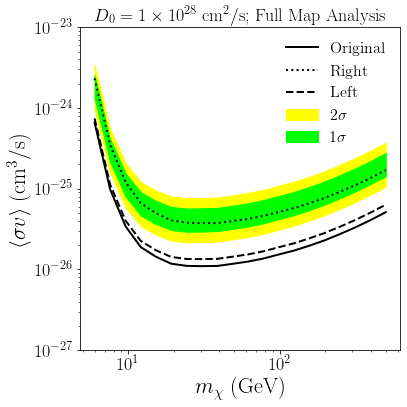

In [49]:
'''
Figure 22
expected and actual limits from our original search region and actual limits from the right and left sides
arrays come from Stats_method4.ipynb
'''
sph_ave = 'weighted_dl'
tex_label = 'limits_' + sph_ave
rl_mask0=''
rl_mask1=''
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['lims_real', 'lims_expected', 'mx_set', 'inds', 'abs_z']
lims_real, lims_exp, mx_set, inds, abs_z = load_arrays(array_path, tex_label, names)

tex_label = 'limits_' + sph_ave
rl_mask0=''
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
    names = ['lims_real']
lims_real_right= load_arrays(array_path, tex_label, names)[0]

tex_label = 'limits_' + sph_ave
rl_mask0=''
rl_mask1='right'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
    names = ['lims_real']
lims_real_left= load_arrays(array_path, tex_label, names)[0]

colors=['yellow', 'lime']
num_mx = 20
mx_st_set = num_mx*np.arange(3)
D0ind = 1
mx_st = mx_st_set[D0ind]
D0_set = np.array([3e27, 1e28, 3e28, 8e28])
fig = plt.figure()
ax = fig.add_subplot(111)
for z, ind, c in zip(abs_z, inds, colors):
    ax.fill_between(mx_set[mx_st:mx_st+num_mx], lims_exp[0][mx_st:mx_st+num_mx, ind[0]], lims_exp[0][mx_st:mx_st+num_mx,ind[1]], label=r'$' + str(z) + r'\sigma$', color=c)
ax.plot(mx_set[mx_st:mx_st+num_mx], lims_real[0][mx_st:mx_st+num_mx], label='Original', color='k')
ax.plot(mx_set[mx_st:mx_st+num_mx], lims_real_right[0][mx_st:mx_st+num_mx], linestyle='dotted', label='Right', color='k')
ax.plot(mx_set[mx_st:mx_st+num_mx], lims_real_left[0][mx_st:mx_st+num_mx], linestyle='dashed', label='Left', color='k')
ax.set_ylim([10**(-27), 10**(-23)])
ax.set_title(r'$D_0 = '+ latex_float(D0_set[D0ind], 0) + r' \; \mathrm{cm^2/s}$; Full Map Analysis', size=18)
ax.set_ylabel(r'$\langle \sigma v\rangle \;\rm{(cm^3/s)}$')
ax.set_xlabel(r'$m_\chi \;\rm{(GeV)}$')
ax.set_xscale('log')
ax.set_yscale('log')
ax.legend(frameon=False)
tex_label = 'limits_' + sph_ave
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

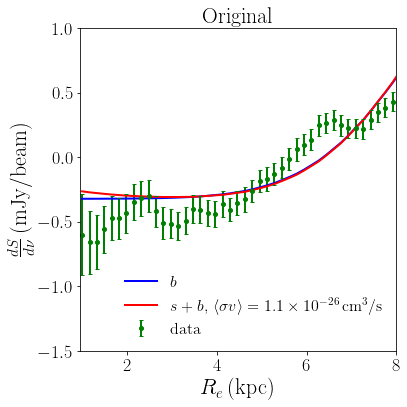

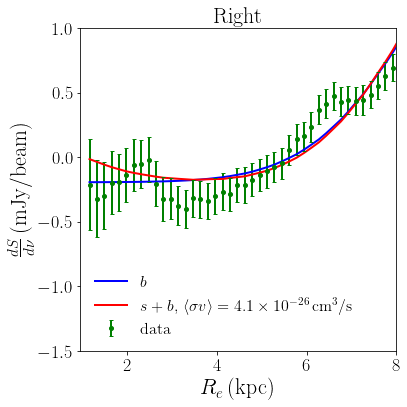

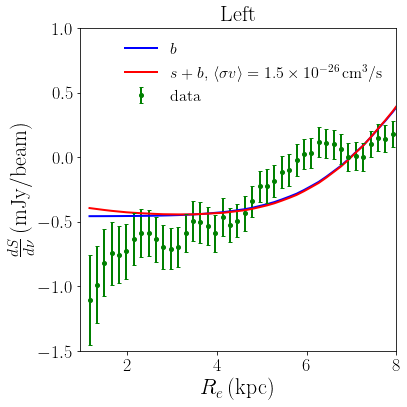

In [50]:
'''
Figure 23
average flux in elliptical annuli as a function of R_e along with the best fit background model and excluded 
signal plus background model
arrays come from Stats_method4.ipynb
'''
tex_label = 'b_sb_data_radial'
rl_mask0 = ''
rl_mask1 = ''

names = ['bins', 'models', 'flux', 'err', 'sigmav']
bins, models, flux, err, sigmav = load_arrays(array_path, tex_label, names)
st = 6
Rlims = [.95, 8]
fluxlims = [-1.5, 1]
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(bins[st:-1], models[0][st:], label=r'$b$', color='b')
ax.plot(bins[st:-1], models[1][st:], label=r'$s+b, \, \langle \sigma v\rangle = ' + latex_float(sigmav, 1) + r'\, \rm cm^3/s$', color='r')
ax.errorbar(bins[st:-1], flux[st:], yerr=err[st:], fmt='o', capsize=2, color='g', label='data')
ax.set_title(r'Original')
ax.set_xlabel(r'$R_e \, \rm (kpc)$')
ax.set_ylabel(r'$\frac{dS}{d \nu} \, \rm (mJy/beam)$')
ax.set_xlim(Rlims)
ax.set_ylim(fluxlims)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

tex_label = 'b_sb_data_radial'
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
    
bins, models, flux, err, sigmav = load_arrays(array_path, tex_label, names)
st = 7
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(bins[st:-1], models[0][st:], label=r'$b$', color='b')
ax.plot(bins[st:-1], models[1][st:], label=r'$s+b, \, \langle \sigma v\rangle = ' + latex_float(sigmav, 1) + r'\, \rm cm^3/s$', color='r')
ax.errorbar(bins[st:-1], flux[st:], yerr=err[st:], fmt='o', capsize=2, color='g', label='data')
ax.set_title(r'Right')
ax.set_xlabel(r'$R_e \, \rm (kpc)$')
ax.set_ylabel(r'$\frac{dS}{d \nu} \, \rm (mJy/beam)$')
ax.set_xlim(Rlims)
ax.set_ylim(fluxlims)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

tex_label = 'b_sb_data_radial'
rl_mask1='right'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
    
bins, models, flux, err, sigmav = load_arrays(array_path, tex_label, names)
st = 7
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(bins[st:-1], models[0][st:], label=r'$b$', color='b')
ax.plot(bins[st:-1], models[1][st:], label=r'$s+b, \, \langle \sigma v\rangle = ' + latex_float(sigmav, 1) + r'\, \rm cm^3/s$', color='r')
ax.errorbar(bins[st:-1], flux[st:], yerr=err[st:], fmt='o', capsize=2, color='g', label='data')
ax.set_title(r'Left')
ax.set_xlabel(r'$R_e \, \rm (kpc)$')
ax.set_ylabel(r'$\frac{dS}{d \nu} \, \rm (mJy/beam)$')
ax.set_xlim(Rlims)
ax.set_ylim(fluxlims)
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

search region semi major axis:  6.907504485323807


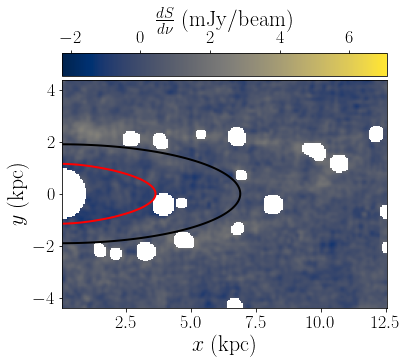

In [38]:
'''
Figure 24
data with center and ps masked with contours showing the search region and signal region
arrays come from Stats_method4.ipynb
'''
rl_mask0 = 'left'
tex_label = 'data_basemask'
if rl_mask0 != '':
    tex_label += '_' + rl_mask0 
names = ['data', 'base_mask', 'x', 'y', 'ell_params', 'test_sig', 'resid', 'wfin', 'levs']
data, base_mask, x, y, ell_params, test_signal, resid, w_fin, levs = load_arrays(array_path, tex_label, names)
mindata = np.min(data)
maxdata = np.max(data)
n, N = data.shape
n0 = int((n-1)/2 + 1)
N0 = int((N-1)/2 + 1)
nsig_search = 1
elld_search = np.sqrt(x**2+(ell_params[0]**2)*y**2)
ind_sig = 4
left_mask = x>0
test_signal = ma.array(test_signal, mask=np.logical_not(left_mask))
elld_search = ma.array(elld_search, mask=np.logical_not(left_mask))
lev_signal = levs[ind_sig]
lev_search = ell_params[1]-nsig_search*ell_params[2]
ma_data = ma.array(data, mask=np.logical_not(base_mask))
fig, ax = make_image_M31(ma_data[:, N0:], x[0, N0:], y[:, 0], fig_size=(fig_width, fig_width), minmax=[mindata, maxdata])
cont_sig = ax.contour(x[:, N0:], y[:, N0:], test_signal[:, N0:], [np.array(lev_signal)], colors='r')
cont_sea = ax.contour(x[:, N0:], y[:, N0:], elld_search[:, N0:], [np.array(lev_search)], colors='k')
#level_labels_sig = {lev: r'signal region' for lev in cont_sig.levels}
#ax.clabel(cont_sig, inline=True, fontsize=16, fmt=level_labels_sig)
#level_labels_sea = {lev: r'search region' for lev in cont_sea.levels}
#ax.clabel(cont_sea, inline=True, fontsize=16, fmt=level_labels_sea)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')
print('search region semi major axis: ', np.max(x[np.where(elld_search<lev_search)]))

3.6535560914109393


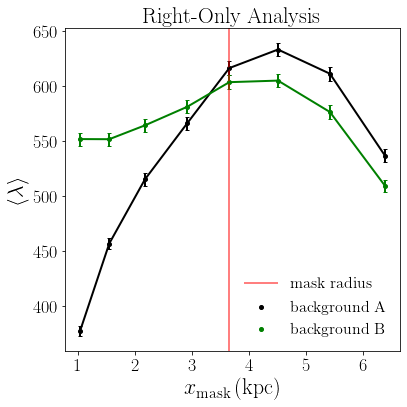

In [75]:
'''
Figure 25
test statistic assuming background only hypothesis for background models A and B for a variety of signal masks 
in the right search region
arrays come from Stats_method4.ipynb
'''
rl_mask0 = 'left'
tex_label = 'mean_ts'
if rl_mask0 != '':
    tex_label += '_' + rl_mask0 
names = ['Re', 'TS_A', 'TS_B', 'err_A', 'err_B']
Rmask, TSA, TSB, errA, errB = load_arrays(array_path, tex_label, names)
print(Rmask[4])
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(Rmask[:-2], TSA[:-2], color='k', label=r'background A')
ax.errorbar(Rmask[:-2], TSA[:-2], yerr=errA[:-2], color='k',  capsize=2)
ax.scatter(Rmask[:-2], TSB[:-2], color='g', label=r'background B')
ax.errorbar(Rmask[:-2], TSB[:-2], yerr=errB[:-2], color='g', capsize=2)
ax.axvline(x=Rmask[4], color='r', label='mask radius', alpha=.5)
ax.set_xlabel(r'$x_{\rm mask} \, \rm (kpc)$')
ax.set_ylabel(r'$\langle \lambda \rangle$')
ax.legend(frameon=False)
ax.set_title(r'Right-Only Analysis')
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

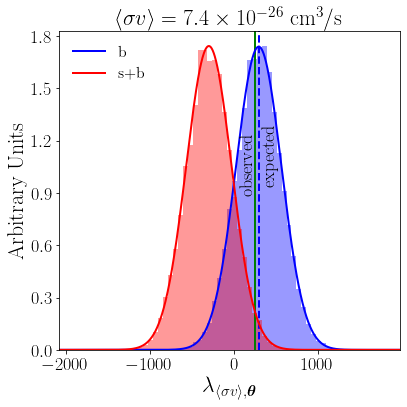

In [80]:
'''
Figure 26a
histograms of the test statistics from pseudodata from signal plus background and background only hypotheses
for a signal that is just barely excluded
arrays come from Stats_method4.ipynb
'''

rl_mask0 = 'left'
rl_mask1 = 'left'
tex_label='CL_hist'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
    
names = ['dchib', 'dchisb', 'bins', 'dchi_data', 'dchib_mean', 'dchi_full', 'pdf_b', 'pdf_sb', 'sigmav']
dchib, dchisb, bins, dchi_data, dchib_mean, dchi_full, pdf_b, pdf_sb, sigmav = load_arrays(array_path, tex_label, names)
N = 20000
rescaler = 1000
delta_bins = [b[1]-b[0] for b in bins]
end = ['_' + str(i+1) for i in range(len(sigmav))]
xy_obs =(75, 900/rescaler)
xy_exp = (350, 950/rescaler)

i = 1
tex_label_final = tex_label+ end[i]
fig = plt.figure()
ax = fig.add_subplot(111)
frq, edges = np.histogram(dchib[i], bins=bins[i], density=False)
ax.bar(edges[:-1], frq/rescaler, width=np.diff(edges), align="edge", alpha=.4, color='b')
frq, edges = np.histogram(dchisb[i], bins=bins[i], density=False)
ax.bar(edges[:-1], frq/rescaler, width=np.diff(edges), align="edge", alpha=.4, color='r')
ax.axvline(x=dchi_data[i], color='g')
ax.axvline(x=dchib_mean[i], color='b', linestyle='--')
ax.plot(dchi_full[i], delta_bins[i]*N*pdf_b[i]/rescaler, label='b', color='b')
ax.plot(dchi_full[i], delta_bins[i]*N*pdf_sb[i]/rescaler, label='s+b', color='r')
ax.text(*xy_obs, r'observed', rotation=90)
ax.text(*xy_exp, r'expected', rotation=90)
ax.set_title(r'$\langle\sigma v\rangle=' + latex_float(sigmav[i], 1) + r'\;\rm{cm^3/s}$')
ax.set_xlabel(r'$\lambda_{\langle \sigma v\rangle , \boldsymbol{\theta}}$')
ax.set_ylabel(r'Arbitrary Units')
ax.set_yticks(yticks[i])
xmin = dchi_full[i][0]
xmax = dchi_full[i][-1]
ax.set_xlim([xmin, xmax])
ax.legend(frameon=False, loc='upper left')
#ax.ticklabel_format(axis='y', style='sci', scilimits=(-2, 2))
fig.tight_layout()
fig.savefig(fig_path + tex_label_final + '.pdf', format = 'pdf', bbox_inches='tight')

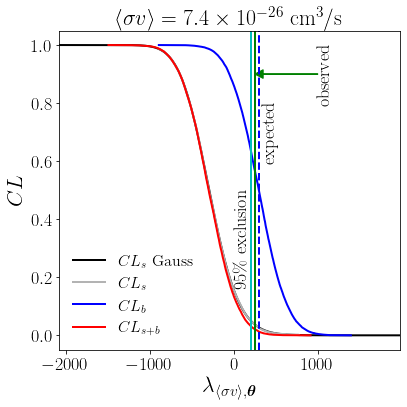

In [807]:
'''
Figure 26b
CL curves from the same signal shown in Figure 26a
arrays come from Stats_method4.ipynb
'''
rl_mask0 = 'left'
rl_mask1 = 'left'
tex_label='CL_curves'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['CLs_gauss', 'CLs', 'dchi_full', 'dchib_srt', 'dchisb_srt', 'perc_b', 'perc_sb', 'dchi_array', 'dchi_data', 'ind95', 'dchib_mean', 'sigmav']

CLs_gauss, CLs, dchi_full, dchib_srt, dchisb_srt, perc_b, perc_sb, dchi_array, dchi_data, \
ind95, dchib_mean, sigmav = load_arrays(array_path, tex_label, names)

xy_obs =(1000, .8)
xy_exp = (350, .6)
xy_95 = (0, .17)

i=1
tex_label_final = tex_label + end[i]

fig = plt.figure()
ax = fig.add_subplot(111)
#plt.plot(dchi_full, CL_b_gauss, label=r'$CL_b$', color='b')
#plt.plot(dchi_full, CL_sb_gauss, label=r'$CL_{s+b}$', color='r')
ax.plot(dchi_full[i], CLs_gauss[i], label=r'$CL_s$ Gauss', color='k')
ax.plot(dchi_array[i], CLs[i], label=r'$CL_s$', color='.7')
#plt.plot(dchi_array, CL_s, label=r'$CL_s$', color='.5')
ax.plot(dchib_srt[i], 1-perc_b[i], label=r'$CL_b$', color='b')
ax.plot(dchisb_srt[i], 1-perc_sb[i], label=r'$CL_{s+b}$', color='r')
xmin = dchi_full[i][0]
xmax = dchi_full[i][-1]
ax.set_xlim([xmin, xmax])
#plt.ylim([0, .3])
ax.set_title(r'$\langle\sigma v\rangle=' + latex_float(sigmav[i], 1) + r'\;\rm{cm^3/s}$')
ax.set_xlabel(r'$\lambda_{\langle \sigma v\rangle , \boldsymbol{\theta}}$')
ax.set_ylabel(r'$CL$')
ax.axvline(x=dchi_data[i], color='g')
ax.axvline(x=dchi_full[i][ind95[i]], color='c')
ax.axvline(x=dchib_mean[i], color='b', linestyle='--')
ax.text(*xy_obs, r'observed', rotation=90)
ax.arrow(xy_obs[0], xy_obs[1]+.1, -650, 0, width=0.002, head_width = .03, head_length=100, color = 'g')
ax.text(*xy_exp, r'expected', rotation=90)
ax.text(*xy_95, r'$95\%$ exclusion', rotation=90)
ax.legend(frameon = False, loc='lower left')

fig.tight_layout()
fig.savefig(fig_path + tex_label_final + '.pdf', format = 'pdf', bbox_inches='tight')

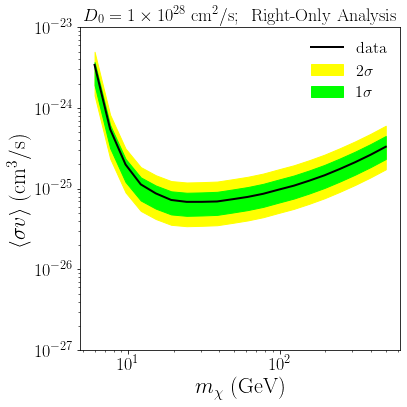

In [91]:
'''
Figure 27
limits from the weighted_dl averaging scheme and default astrophysical model in the right search region
arrays come from Stats_method4.ipynb
'''
sph_ave = 'weighted_dl'
tex_label = 'limits_' + sph_ave
rl_mask0='left'
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['lims_real', 'lims_expected', 'mx_set', 'inds', 'abs_z']
lims_real, lims_exp, mx_set, inds, abs_z = load_arrays(array_path, tex_label, names)

colors=['yellow', 'lime']
num_mx = 20
mx_st_set = num_mx*np.arange(3)
D0ind = 1
mx_st = mx_st_set[D0ind]
D0_set = np.array([3e27, 1e28, 3e28, 8e29])
fig = plt.figure()
ax = fig.add_subplot(111)
for z, ind, c in zip(abs_z, inds, colors):
    ax.fill_between(mx_set[mx_st:mx_st+num_mx], lims_exp[0][mx_st:mx_st+num_mx, ind[0]], lims_exp[0][mx_st:mx_st+num_mx,ind[1]], label=r'$' + str(z) + r'\sigma$', color=c)
ax.plot(mx_set[mx_st:mx_st+num_mx], lims_real[0][mx_st:mx_st+num_mx], label='data', color='k')

ax.set_ylim([10**(-27), 10**(-23)])
ax.set_title(r'$D_0 = '+ latex_float(D0_set[D0ind], 0) + r' \; \mathrm{cm^2/s}; \,\,\,\,$' + 'Right-Only Analysis', size=18)
ax.set_ylabel(r'$\langle \sigma v\rangle \;\rm{(cm^3/s)}$')
ax.set_xlabel(r'$m_\chi \;\rm{(GeV)}$')
ax.set_xscale('log')
ax.set_yscale('log')
ax.legend(frameon=False)
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

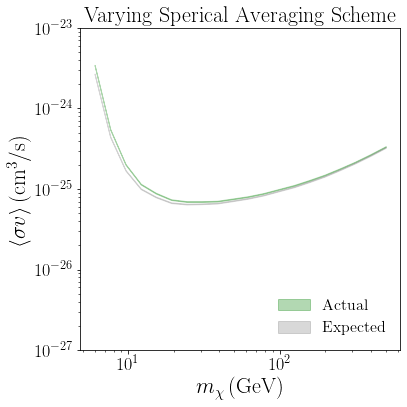

In [663]:
'''
Figure 28a
variation of expected and actual limits due to varying averaging proceedure
arrays come from Stats_method4.ipynb
'''
sph_ave = 'weighted_dl'
tex_label = 'limits_' + sph_ave
rl_mask0='left'
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['lims_real', 'lims_expected', 'mx_set', 'inds', 'abs_z']
lims_real0, lims_exp0, mx_set0, inds0, abs_z0 = load_arrays(array_path, tex_label, names)

sph_ave = 'unweighted'
tex_label = 'limits_' + sph_ave
rl_mask0='left'
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['lims_real', 'lims_expected', 'mx_set', 'inds', 'abs_z']
lims_real1, lims_exp1, mx_set1, inds1, abs_z1 = load_arrays(array_path, tex_label, names)

num_mx = 20
num_D = 4
mx_st_set = num_mx*np.arange(num_D)
D0ind = 1
mx_st = mx_st_set[D0ind]
D0_set = np.array([5e27, 1.1e28, 5e28, 2e29])
med_lims_exp0 = lims_exp0[0][mx_st:mx_st+num_mx, 2]
med_lims_exp1 = lims_exp1[0][mx_st:mx_st+num_mx, 2]
max_exp = np.max(np.array([med_lims_exp0, med_lims_exp1]), axis=0)
min_exp = np.min(np.array([med_lims_exp0, med_lims_exp1]), axis=0)

lims_real0 = lims_real0[0][mx_st:mx_st+num_mx]
lims_real1 = lims_real1[0][mx_st:mx_st+num_mx]
max_real = np.max(np.array([lims_real0, lims_real1]), axis=0)
min_real = np.min(np.array([lims_real0, lims_real1]), axis=0)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.fill_between(mx_set0[mx_st:mx_st+num_mx], min_real, max_real, label=r'Actual', color='g', alpha=.3)
ax.fill_between(mx_set0[mx_st:mx_st+num_mx], min_exp, max_exp, label=r'Expected', color='.5', alpha=.3)
ax.set_xlabel(r'$m_\chi \, \rm (GeV)$')
ax.set_ylabel(r'$\langle \sigma v \rangle \, \rm (cm^3/s)$')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title(r'Varying Sperical Averaging Scheme')
ax.legend(frameon=False, loc='lower right')
ax.set_ylim([10**(-27), 10**(-23)])
tex_label = 'limits_varying_sphavg'
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

NameError: name 'lims_exp' is not defined

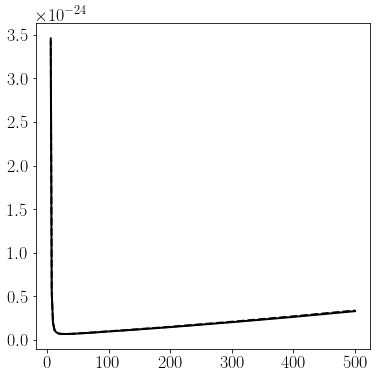

In [9]:
'''
Figure 28a
variation of expected and actual limits due to varying averaging proceedure
arrays come from Stats_method4.ipynb
'''
sph_ave = 'weighted_dl'
tex_label = 'limits_' + sph_ave
rl_mask0='left'
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['lims_real', 'lims_expected', 'mx_set', 'inds', 'abs_z']
lims_real0, lims_exp0, mx_set0, inds0, abs_z0 = load_arrays(array_path, tex_label, names)
names = ['dwarf', 'Gordon', 'Daylan', 'Calore']
labels=['Ackermann et al. 2015', 'Gordon \& Macias 2013', 'Daylan et al. 2014', 'Calore et al. 2014']
variables = ['mx', 'sigmav']
dicts=[]
for name in names:
    dicts.append({})
for var in variables:
    for d, name in zip(dicts, names):
        d[var] = load_arrays(array_path, tex_label, [name+'_'+var])[0]
for name, d in zip(names, dicts):
    if name != names[0]:
        d['mx'] = np.append(d['mx'], d['mx'][0])
        d['sigmav'] = np.append(d['sigmav'], d['sigmav'][0])
sph_ave = 'unweighted'
tex_label = 'limits_' + sph_ave
rl_mask0='left'
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['lims_real', 'lims_expected', 'mx_set', 'inds', 'abs_z']
lims_real1, lims_exp1, mx_set1, inds1, abs_z1 = load_arrays(array_path, tex_label, names)

mx_set = mx_set0
num_mx = 20
num_D = 4
mx_st_set = num_mx*np.arange(num_D)
D0ind = 1
mx_st = mx_st_set[D0ind]
D0_set = np.array([3e27, 1e28, 3e28, 8e28])
med_lims_exp0 = lims_exp0[0][mx_st:mx_st+num_mx, 2]
med_lims_exp1 = lims_exp1[0][mx_st:mx_st+num_mx, 2]
max_exp = np.max(np.array([med_lims_exp0, med_lims_exp1]), axis=0)
min_exp = np.min(np.array([med_lims_exp0, med_lims_exp1]), axis=0)

lims_real0 = lims_real0[0][mx_st:mx_st+num_mx]
lims_real1 = lims_real1[0][mx_st:mx_st+num_mx]
max_real = np.max(np.array([lims_real0, lims_real1]), axis=0)
min_real = np.min(np.array([lims_real0, lims_real1]), axis=0)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(mx_set[mx_st:mx_st+num_mx], lims_real0, label=r'weighted', color='k', linestyle='-')
ax.plot(mx_set[mx_st:mx_st+num_mx], lims_real1, label=r'unweighted', color='k', linestyle='--')
#ax.plot(mx_set0[mx_st:mx_st+num_mx], med_lims_exp0, color='g', linestyle='-')
#ax.plot(mx_set0[mx_st:mx_st+num_mx], med_lims_exp1, color='g', linestyle='--')
colors=['yellow', 'lime']
for z, ind, c in zip(abs_z0, inds0, colors):
    ax.fill_between(mx_set[mx_st:mx_st+num_mx], lims_exp0[0][mx_st:mx_st+num_mx, ind[0]], lims_exp0[0][mx_st:mx_st+num_mx,ind[1]], color=c)
colors=['blue', 'violet', 'red', 'cyan']        
for d, l, c in zip(dicts, labels, colors):
    ax.plot(d['mx'], d['sigmav'], color=c, label=l)
    
ax.set_xlabel(r'$m_\chi \, \rm (GeV)$')
ax.set_ylabel(r'$\langle \sigma v \rangle \, \rm (cm^3/s)$')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title(r'Spherical Averaging Scheme')
ax.legend(frameon=False, loc='upper right', ncol=1, fontsize=14)
ax.set_xlim([6, 500])
ax.set_ylim([10**(-27), 10**(-23)])
tex_label = 'limits_varying_sphavg'
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

In [8]:
print(mx_set0)
print(mx_set1)

[  6.    7.6   9.6  12.1  15.2  19.2  24.3  30.6  38.6  48.8  61.5  77.7
  98.  123.7 156.1 197.1 248.7 313.9 396.2 500.    6.    7.6   9.6  12.1
  15.2  19.2  24.3  30.6  38.6  48.8  61.5  77.7  98.  123.7 156.1 197.1
 248.7 313.9 396.2 500.    6.    7.6   9.6  12.1  15.2  19.2  24.3  30.6
  38.6  48.8  61.5  77.7  98.  123.7 156.1 197.1 248.7 313.9 396.2 500.
   6.    7.6   9.6  12.1  15.2  19.2  24.3  30.6  38.6  48.8  61.5  77.7
  98.  123.7 156.1 197.1 248.7 313.9 396.2 500. ]
[  6.    7.6   9.6  12.1  15.2  19.2  24.3  30.6  38.6  48.8  61.5  77.7
  98.  123.7 156.1 197.1 248.7 313.9 396.2 500.    6.    7.6   9.6  12.1
  15.2  19.2  24.3  30.6  38.6  48.8  61.5  77.7  98.  123.7 156.1 197.1
 248.7 313.9 396.2 500.    6.    7.6   9.6  12.1  15.2  19.2  24.3  30.6
  38.6  48.8  61.5  77.7  98.  123.7 156.1 197.1 248.7 313.9 396.2 500.
   6.    7.6   9.6  12.1  15.2  19.2  24.3  30.6  38.6  48.8  61.5  77.7
  98.  123.7 156.1 197.1 248.7 313.9 396.2 500. ]


In [106]:
print(dicts[0])

{'mx': [array([6.00042232e+00, 6.91830971e+00, 7.84414214e+00, 8.96865406e+00,
       1.00000000e+01, 1.24321275e+01, 1.54557794e+01, 1.95393040e+01,
       2.40889673e+01, 2.82428872e+01, 3.51119173e+01, 4.29266772e+01,
       5.20431573e+01, 6.36262553e+01, 7.71387731e+01, 9.83393363e+01,
       1.17244076e+02, 1.45759330e+02, 1.85819338e+02, 2.31012970e+02,
       2.89613086e+02, 3.57048549e+02, 4.32876128e+02, 5.11788955e+02,
       6.30957344e+02, 7.45980152e+02, 8.81971488e+02, 1.05152156e+03,
       1.23284674e+03, 1.48220779e+03, 1.69469251e+03, 1.98692657e+03,
       2.49094212e+03, 2.94503804e+03, 3.51119173e+03, 4.08233923e+03,
       4.86712755e+03, 5.65883815e+03, 6.41612368e+03, 7.09429250e+03,
       8.11130831e+03, 8.96865406e+03, 9.83393363e+03])], 'sigmav': [array([5.07744422e-27, 5.07744422e-27, 5.07744422e-27, 5.07744422e-27,
       5.07744422e-27, 5.83618476e-27, 6.55438968e-27, 7.36097739e-27,
       8.07714844e-27, 9.07112790e-27, 1.06715083e-26, 1.19847515e-26,


In [102]:
a = np.array([1,2,3])
np.append(a, 0)
print(a)

[1 2 3]


In [ ]:
names = ['dwarf', 'Gordon', 'Daylan', 'Calore']
labels=[r'Ackermann et al. 2015', r'Gordon & Macias 2013', r'Daylan et al. 2014', r'Calore et al. 2014']
variables = ['mx', 'sigmav']
dicts=[]
for name in names:
    dicts.append({})
for var in variables:
    for d, name in zip(dicts, names):
        d[var] = load_arrays(array_path, tex_label, [name+'_'+var])
for name, d in zip(names, dicts):
    if name != names[0]:
        np.append(d['mx'], d['mx'][0])
        np.append(d['sigmav'], d['sigmav'][0])
        
colors=['blue', 'violet', 'red', 'cyan']        
for d, l, c in zip(dicts, labels, colors):
    ax.plot(d['mx'], d['sigmav'], color=c, label=labels)

In [88]:
dicts

[{'mx': [array([6.00042232e+00, 6.91830971e+00, 7.84414214e+00, 8.96865406e+00,
          1.00000000e+01, 1.24321275e+01, 1.54557794e+01, 1.95393040e+01,
          2.40889673e+01, 2.82428872e+01, 3.51119173e+01, 4.29266772e+01,
          5.20431573e+01, 6.36262553e+01, 7.71387731e+01, 9.83393363e+01,
          1.17244076e+02, 1.45759330e+02, 1.85819338e+02, 2.31012970e+02,
          2.89613086e+02, 3.57048549e+02, 4.32876128e+02, 5.11788955e+02,
          6.30957344e+02, 7.45980152e+02, 8.81971488e+02, 1.05152156e+03,
          1.23284674e+03, 1.48220779e+03, 1.69469251e+03, 1.98692657e+03,
          2.49094212e+03, 2.94503804e+03, 3.51119173e+03, 4.08233923e+03,
          4.86712755e+03, 5.65883815e+03, 6.41612368e+03, 7.09429250e+03,
          8.11130831e+03, 8.96865406e+03, 9.83393363e+03])],
  'sigmav': [array([5.07744422e-27, 5.07744422e-27, 5.07744422e-27, 5.07744422e-27,
          5.07744422e-27, 5.83618476e-27, 6.55438968e-27, 7.36097739e-27,
          8.07714844e-27, 9.0711279

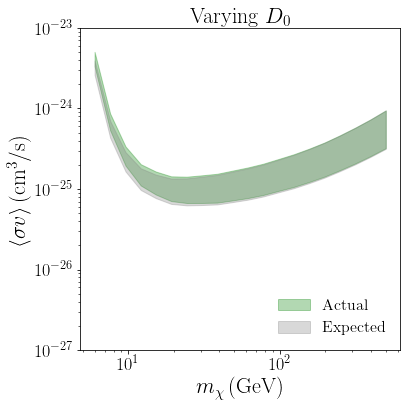

In [809]:
'''
Figure 28b
variation of expected and actual limits due to varying D0
arrays come from Stats_method4.ipynb
'''
sph_ave = 'weighted_dl'
tex_label = 'limits_' + sph_ave
rl_mask0='left'
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['lims_real', 'lims_expected', 'mx_set', 'inds', 'abs_z']
lims_real, lims_exp, mx_set, inds, abs_z = load_arrays(array_path, tex_label, names)

num_mx = 20
num_D = 4
mx_st_set = num_mx*np.arange(num_D)
D0ind = 1
mx_st = mx_st_set[D0ind]
D0_set = np.array([3e27, 1e28, 3e28, 8e29])

med_lims_exp = lims_exp[0][:, 2]
med_lims_exp = med_lims_exp.reshape((num_D, num_mx))
min_exp = np.min(med_lims_exp, axis=0)
max_exp = np.max(med_lims_exp, axis=0)

lims_real = lims_real[0].reshape((num_D, num_mx))
min_real = np.min(lims_real, axis=0)
max_real= np.max(lims_real, axis=0)

fig = plt.figure()
ax = fig.add_subplot(111)
for lim in lims_real:
ax.fill_between(mx_set[mx_st:mx_st+num_mx], min_real, max_real, label=r'Actual', color='g', alpha=.3)
ax.fill_between(mx_set[mx_st:mx_st+num_mx], min_exp, max_exp, label=r'Expected', color='.5', alpha=.3)
ax.set_xlabel(r'$m_\chi \, \rm (GeV)$')
ax.set_ylabel(r'$\langle \sigma v \rangle \, \rm (cm^3/s)$')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title(r'Varying ' + r'$D_0$')
ax.legend(frameon=False, loc='lower right')
ax.set_ylim([10**(-27), 10**(-23)])
tex_label += '_varying_D0'
#fig.tight_layout()
#fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')

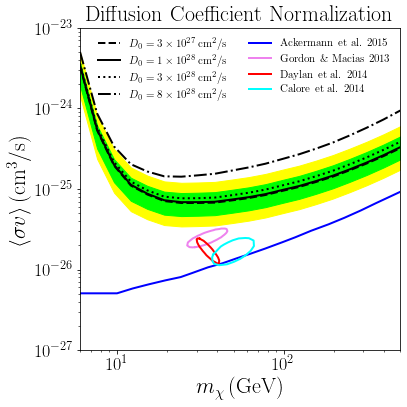

In [117]:
'''
Figure 28b
variation of expected and actual limits due to varying D0
arrays come from Stats_method4.ipynb
'''
sph_ave = 'weighted_dl'
tex_label = 'limits_' + sph_ave
rl_mask0='left'
rl_mask1='left'
if rl_mask0!='' or rl_mask1!='':
    tex_label += '_' + rl_mask0 + '_'+ rl_mask1
names = ['lims_real', 'lims_expected', 'mx_set', 'inds', 'abs_z']
lims_real, lims_exp, mx_set, inds, abs_z = load_arrays(array_path, tex_label, names)
names = ['dwarf', 'Gordon', 'Daylan', 'Calore']
labels=['Ackermann et al. 2015', 'Gordon \& Macias 2013', 'Daylan et al. 2014', 'Calore et al. 2014']
variables = ['mx', 'sigmav']
dicts=[]
for name in names:
    dicts.append({})
for var in variables:
    for d, name in zip(dicts, names):
        d[var] = load_arrays(array_path, tex_label, [name+'_'+var])[0]
for name, d in zip(names, dicts):
    if name != names[0]:
        d['mx'] = np.append(d['mx'], d['mx'][0])
        d['sigmav'] = np.append(d['sigmav'], d['sigmav'][0])
num_mx = 20
num_D = 4
mx_st_set = num_mx*np.arange(num_D)
D0ind = 1
mx_st = mx_st_set[D0ind]
mx_set = mx_set[mx_st:mx_st+num_mx]
D0_set = np.array([3e27, 1e28, 3e28, 8e29])

med_lims_exp = lims_exp[0][:, 2]
med_lims_exp = med_lims_exp.reshape((num_D, num_mx))
min_exp = np.min(med_lims_exp, axis=0)
max_exp = np.max(med_lims_exp, axis=0)

lims_real = lims_real[0].reshape((num_D, num_mx))
min_real = np.min(lims_real, axis=0)
max_real= np.max(lims_real, axis=0)

ls = ['--', '-', ':', '-.']
fig = plt.figure()
ax = fig.add_subplot(111)

for l, limr, lime, d in zip(ls, lims_real, med_lims_exp, D0):
    ax.plot(mx_set, limr, color='k', linestyle=l, label=r'$D_0 = ' + latex_float(d, 0) + r'\,\rm cm^2/s$')
    #ax.plot(mx_set, lime, color='g', linestyle=l)
colors=['yellow', 'lime']
for z, ind, c in zip(abs_z, inds, colors):
    ax.fill_between(mx_set, lims_exp[0][mx_st:mx_st+num_mx, ind[0]], lims_exp[0][mx_st:mx_st+num_mx,ind[1]], color=c)
colors=['blue', 'violet', 'red', 'cyan']        
for d, l, c in zip(dicts, labels, colors):
    ax.plot(d['mx'], d['sigmav'], color=c, label=l)
ax.set_xlabel(r'$m_\chi \, \rm (GeV)$')
ax.set_ylabel(r'$\langle \sigma v \rangle \, \rm (cm^3/s)$')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title(r'Diffusion Coefficient Normalization')
ax.legend(frameon=False, loc='upper right', fontsize=11, ncol=2)
ax.set_xlim([6, 500])
ax.set_ylim([10**(-27), 10**(-23)])
tex_label += '_varying_D0'
fig.tight_layout()
fig.savefig(fig_path + tex_label + '.pdf', format = 'pdf', bbox_inches='tight')